In [1]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os, imageio
import cv2
import numpy as np
from jax import random
rand_key = random.PRNGKey(0)

from models.neural_net import NeuralNetwork


%load_ext autoreload
%autoreload 2


%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)

## Helper Functions

In [2]:
def get_image(size=512, \
              image_url='https://bmild.github.io/fourfeat/img/lion_orig.png'):


  img = imageio.imread(image_url)[..., :3] / 255.
  c = [img.shape[0]//2, img.shape[1]//2]
  r = 256
  img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

  if size != 512:
    img = cv2.resize(img, (size, size))

  plt.imshow(img)
  plt.show()


  coords = np.linspace(0, 1, img.shape[0], endpoint=False)
  x_test = np.stack(np.meshgrid(coords, coords), -1)
  test_data = [x_test, img]
  train_data = [x_test[::2, ::2], img[::2, ::2]]

  return train_data, test_data

In [3]:
def get_B_dict(size):
  mapping_size = size // 2 
  B_dict = {}
  B_dict['none'] = None
  B_dict['basic'] = np.eye(2)
  B_gauss = random.normal(rand_key, (mapping_size, 2))
  for scale in [1., 10., 100.]:
    B_dict[f'gauss_{scale}'] = B_gauss * scale

  return B_dict

In [4]:
def input_mapping(x, B):
  if B is None:
    return x
  else:
    print("before:",x.shape)
    x_proj = (2.*np.pi*x) @ B.T
    b=np.concatenate([np.sin(x_proj), np.cos(x_proj)], axis=-1)
    print("after:",b.shape)
    return b

In [5]:
def mse(y, p):
  return np.mean(np.square(y-p))


def psnr(y, p):
  mse = np.mean(np.square(y-p))
  psnr = 20 * np.log10(255.0 / np.sqrt(mse))

  return psnr

/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_20262/3999599749.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


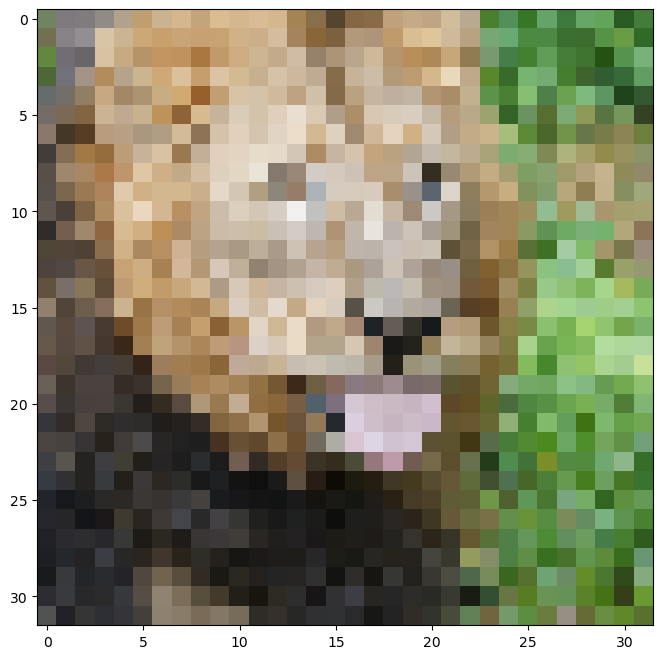

In [6]:
size = 32
train_data, test_data = get_image(size)

In [7]:
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 1000
learning_rate = .0001
output_size = 3
B_dict = get_B_dict(size)

print('B_dict items:')
for k,v in B_dict.items():
    print('\t',k,np.array(v).shape)

B_dict items:
	 none ()
	 basic (2, 2)
	 gauss_1.0 (16, 2)
	 gauss_10.0 (16, 2)
	 gauss_100.0 (16, 2)


In [8]:
def get_input_features(B_dict, mapping):
  y_train = train_data[1].reshape(-1, output_size)
  y_test = test_data[1].reshape(-1, output_size)
  X_train = input_mapping(train_data[0].reshape(-1, 2), B_dict[mapping])
  X_test = input_mapping(test_data[0].reshape(-1, 2), B_dict[mapping])
  print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
  print(type(X_train))
  return X_train, y_train, X_test, y_test

In [9]:
def plot_training_curves(train_loss, train_psnr, test_psnr):
  # plot the training loss
  plt.subplot(2, 1, 1)
  plt.plot(train_loss)
  plt.title('MSE history')
  plt.xlabel('Iteration')
  plt.ylabel('MSE Loss')

  # plot the training and testing psnr
  plt.subplot(2, 1, 2)
  plt.plot(train_psnr, label='train')
  plt.plot(test_psnr, label='test')
  plt.title('PSNR history')
  plt.xlabel('Iteration')
  plt.ylabel('PSNR')
  plt.legend()

  plt.tight_layout()
  plt.show()

def plot_reconstruction(p, y):
  p_im = p.reshape(size,size,3)
  y_im = y.reshape(size,size,3)

  plt.figure(figsize=(12,6))

  # plot the reconstruction of the image
  plt.subplot(1,2,1), plt.imshow(p_im), plt.title("reconstruction")

  # plot the ground truth image
  plt.subplot(1,2,2), plt.imshow(y_im), plt.title("ground truth")

  print("Final Test MSE", mse(y, p))
  print("Final Test psnr",psnr(y, p))

def plot_reconstruction_progress(predicted_images, y, N=8):
  total = len(predicted_images)
  step = total // N
  plt.figure(figsize=(24, 4))

  # plot the progress of reconstructions
  for i, j in enumerate(range(0,total, step)):
      plt.subplot(1, N, i+1)
      plt.imshow(predicted_images[j].reshape(size,size,3))
      plt.axis("off")
      plt.title(f"iter {j}")

  # plot ground truth image
  plt.subplot(1, N+1, N+1)
  plt.imshow(y.reshape(size,size,3))
  plt.title('GT')
  plt.axis("off")
  plt.show()

def plot_feature_mapping_comparison(outputs, gt):
  # plot reconstruction images for each mapping
  plt.figure(figsize=(24, 4))
  N = len(outputs)
  for i, k in enumerate(outputs):
      plt.subplot(1, N+1, i+1)
      plt.imshow(outputs[k]['pred_imgs'][-1].reshape(size, size, -1))
      plt.title(k)
  plt.subplot(1, N+1, N+1)
  plt.imshow(gt)
  plt.title('GT')
  plt.show()

  # plot train/test error curves for each mapping
  iters = len(outputs[k]['train_psnrs'])
  plt.figure(figsize=(16, 6))
  plt.subplot(121)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['train_psnrs'], label=k)
  plt.title('Train error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.subplot(122)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['test_psnrs'], label=k)
  plt.title('Test error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.show()

# Save out video
def create_and_visualize_video(outputs, size=size, epochs=epochs, filename='training_convergence.mp4'):
  all_preds = np.concatenate([outputs[n]['pred_imgs'].reshape(epochs,size,size,3)[::25] for n in outputs], axis=-2)
  data8 = (255*np.clip(all_preds, 0, 1)).astype(np.uint8)
  f = os.path.join(filename)
  imageio.mimwrite(f, data8, fps=20)

  # Display video inline
  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(f, 'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

  N = len(outputs)
  if N == 1:
    return HTML(f'''
    <video width=256 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    ''')
  else:
    return HTML(f'''
    <video width=1000 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    <table width="1000" cellspacing="0" cellpadding="0">
      <tr>{''.join(N*[f'<td width="{1000//len(outputs)}"></td>'])}</tr>
      <tr>{''.join(N*['<td style="text-align:center">{}</td>'])}</tr>
    </table>
    '''.format(*list(outputs.keys())))

In [10]:
def NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt):

    # Initialize a new neural network model
    net = NeuralNetwork(input_size, hidden_sizes, output_size, num_layers, opt)
    b1=.9
    b2=.999
    eps=1e-8
    # Variables to store performance for each epoch
    train_loss = np.zeros(epochs)
    train_psnr = np.zeros(epochs)
    test_psnr = np.zeros(epochs)
    predicted_images = np.zeros((epochs, y_test.shape[0], y_test.shape[1]))

    
    for epoch in tqdm(range(epochs)):
      np.random.seed(42)
      permutation = np.random.permutation(len(X_train))
      X_train = X_train[permutation]
      y_train = y_train[permutation]

      res_train=net.forward(X_train)
      psnr_i=psnr(res_train,y_train)
      train_psnr[epoch]=psnr_i

      loss_i=net.backward(y_train)
      train_loss[epoch]=loss_i
      lr=learning_rate
      net.update(lr=learning_rate,opt=opt)

      res_test=net.forward(X_test)
      psnr_test=psnr(res_test,y_test)
      test_psnr[epoch]=psnr_test

      predicted_images[epoch]=res_test

    return net, train_psnr, test_psnr, train_loss, predicted_images

# Low Resolution Reconstruction

#### Low Resolution Reconstruction - SGD - None Mapping

#### For Multiple Learning Rates

(256, 2) (256, 3) (1024, 2) (1024, 3)
<class 'numpy.ndarray'>
[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

Learning rate: 0.001


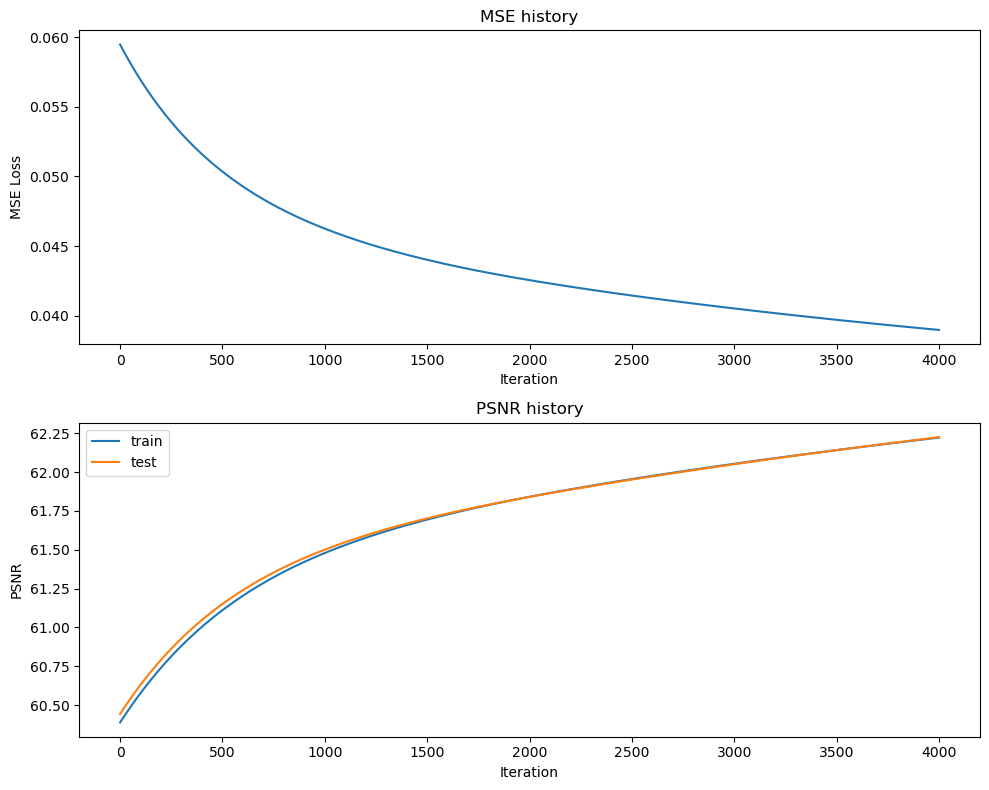

Final Test MSE 0.03895339144236106
Final Test psnr 62.225350857506356


/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3758130134.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


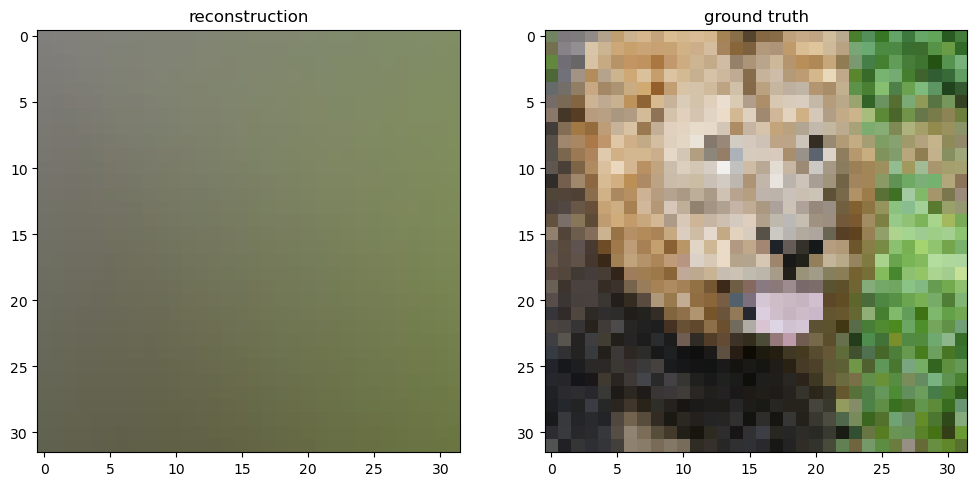

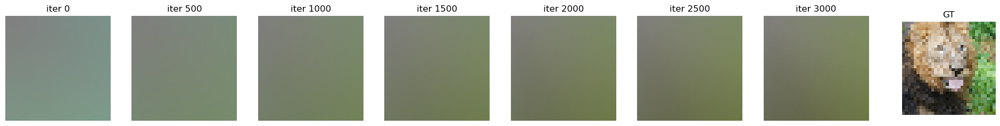

[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

Learning rate: 0.005


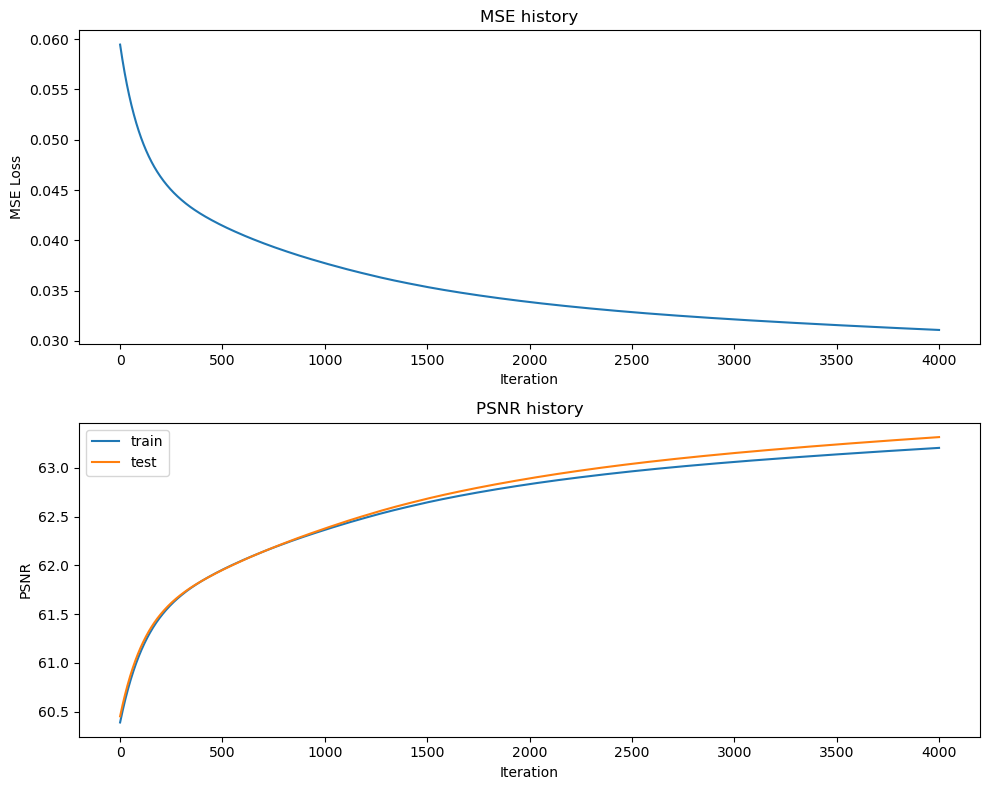

Final Test MSE 0.030303275761418075
Final Test psnr 63.315907829196746


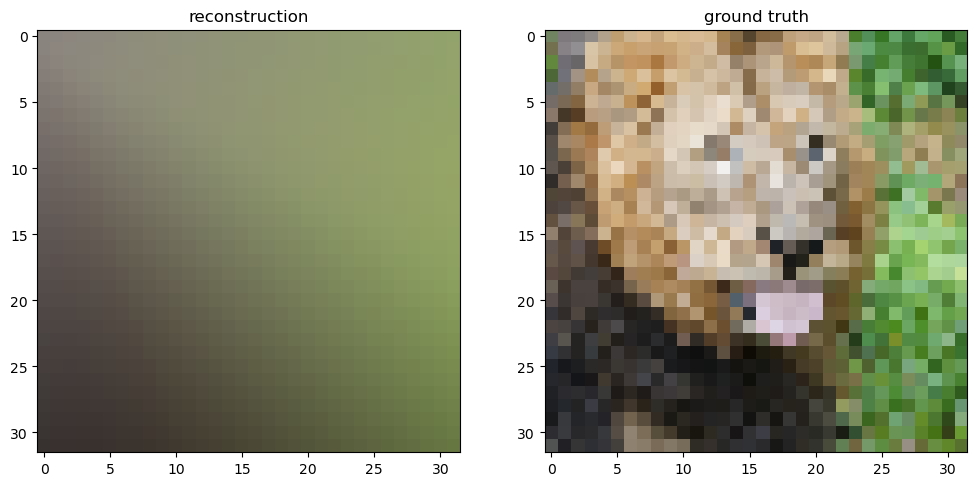

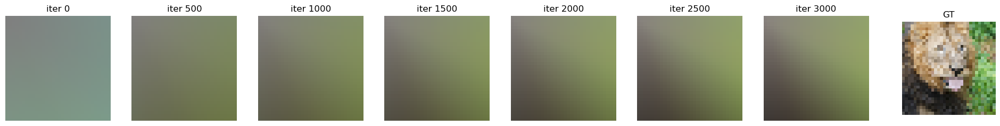

[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

Learning rate: 0.0001


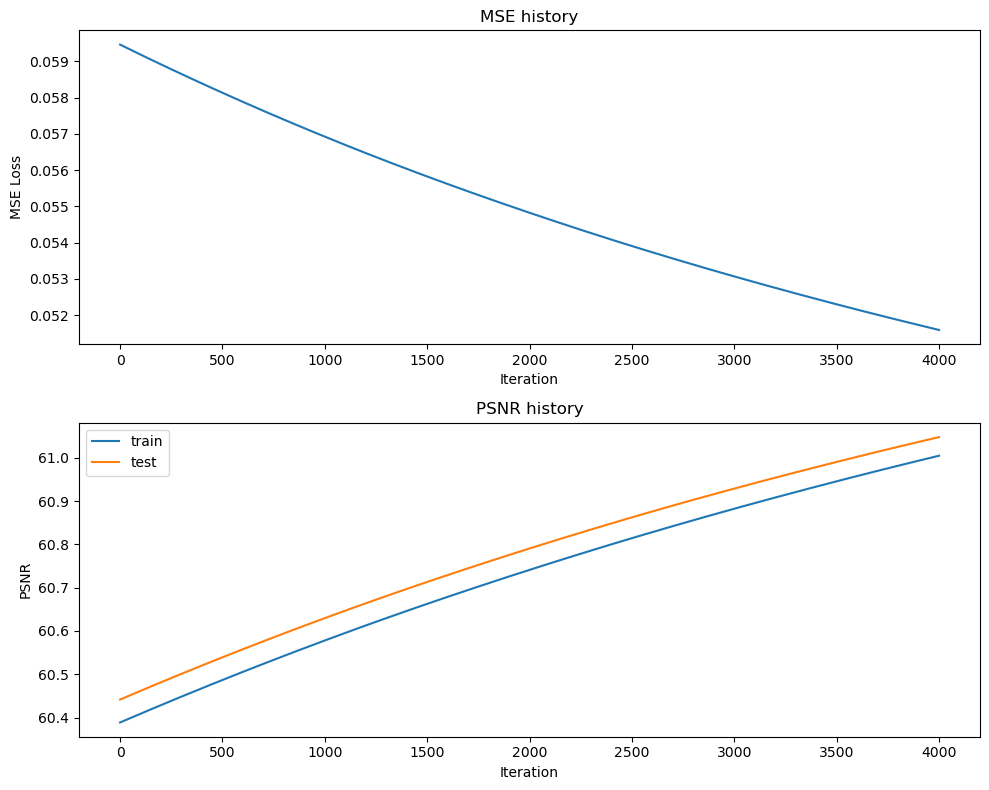

Final Test MSE 0.05108715451674061
Final Test psnr 61.04768647108975


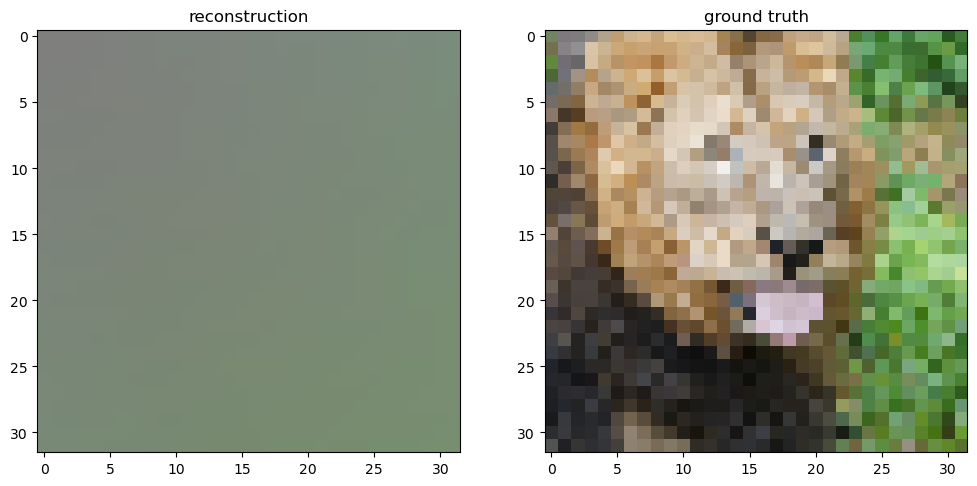

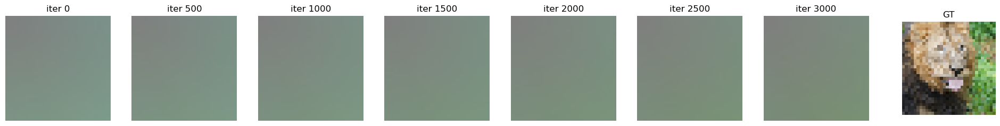

[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

Learning rate: 0.0005


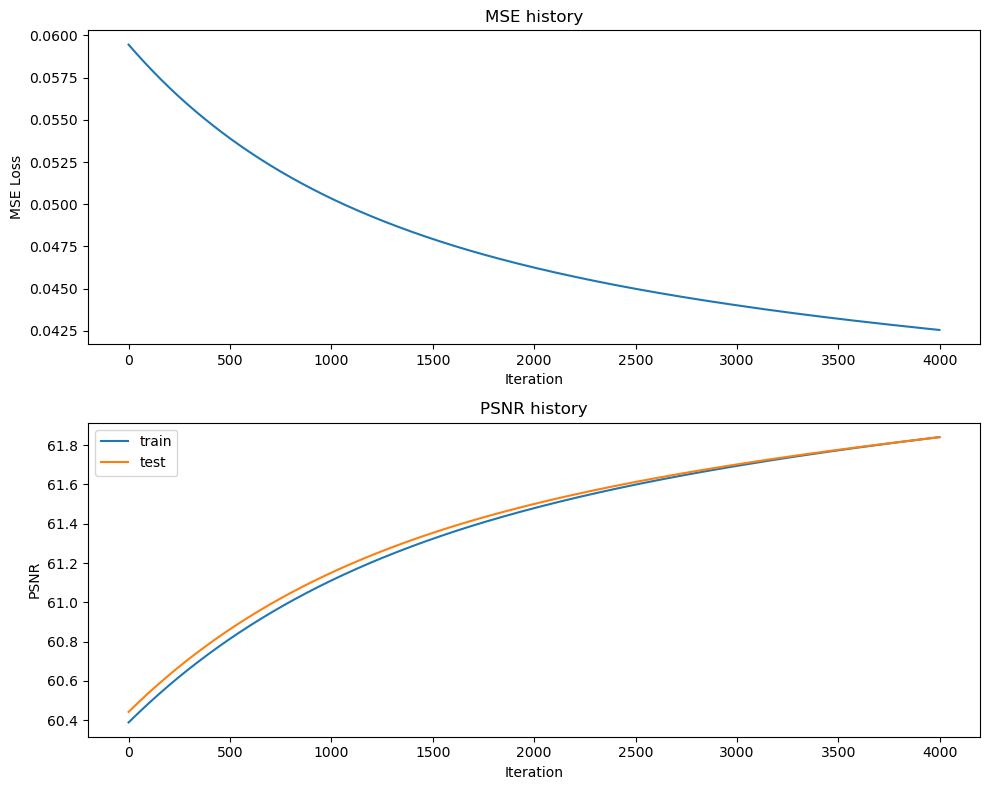

Final Test MSE 0.04256118524234093
Final Test psnr 61.840666471955565


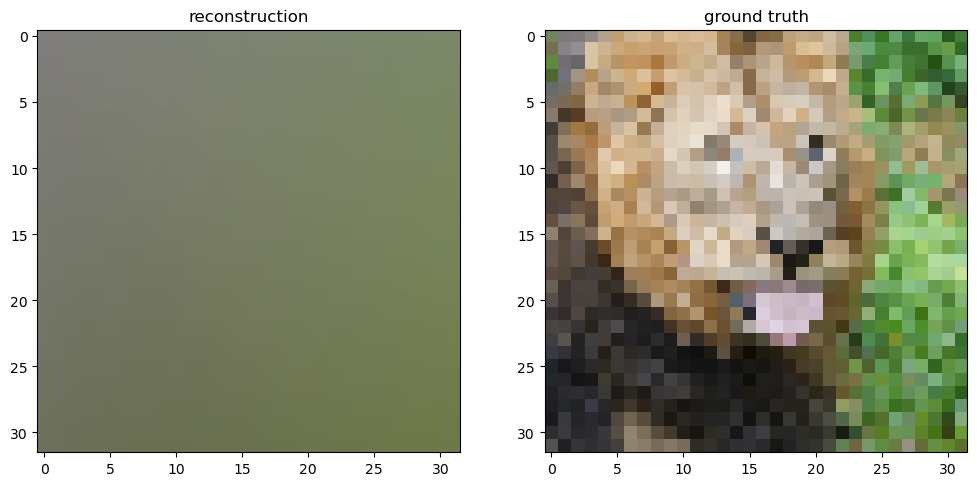

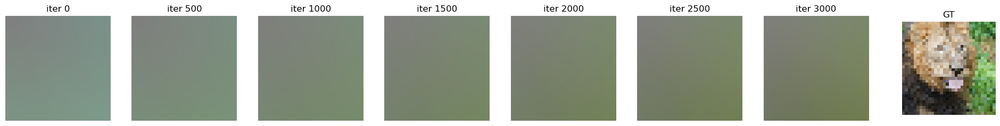

[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

Learning rate: 0.01


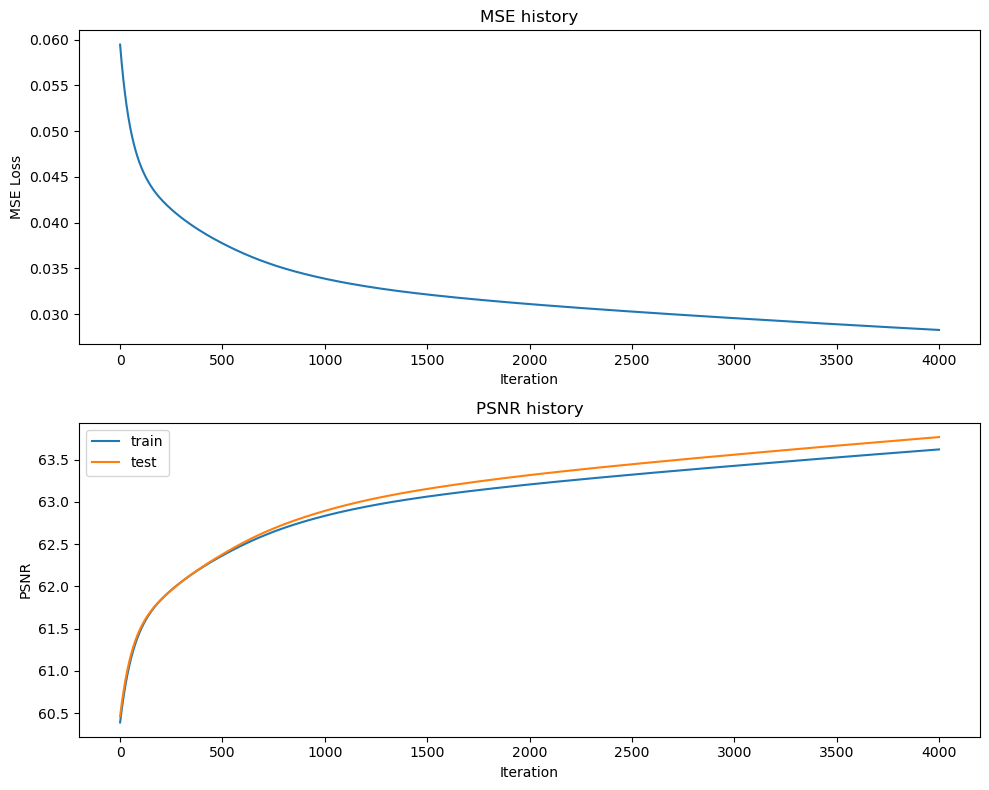

Final Test MSE 0.02732318785868713
Final Test psnr 63.765489927738926


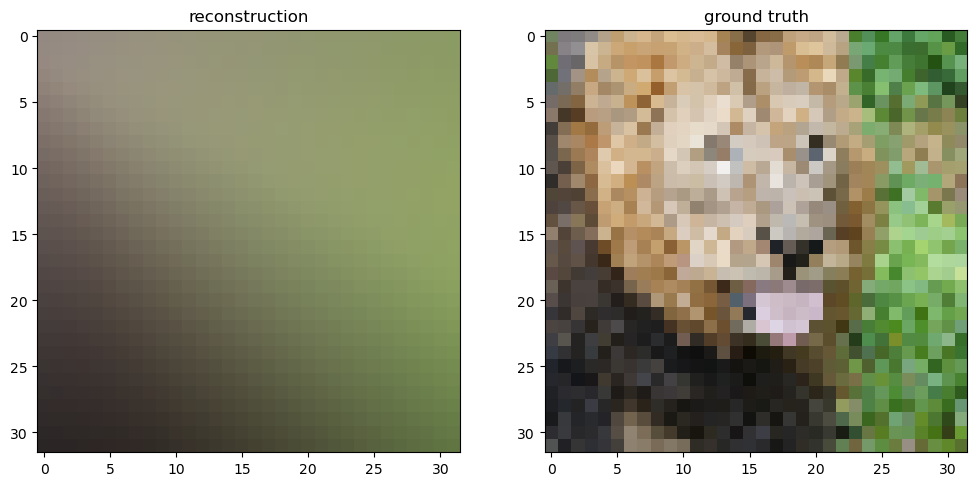

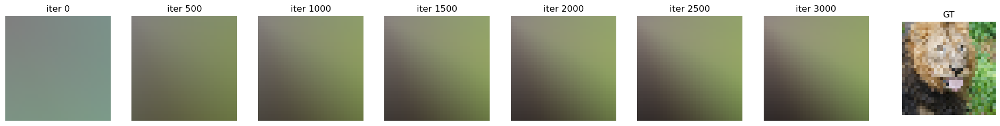

[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

Learning rate: 0.05


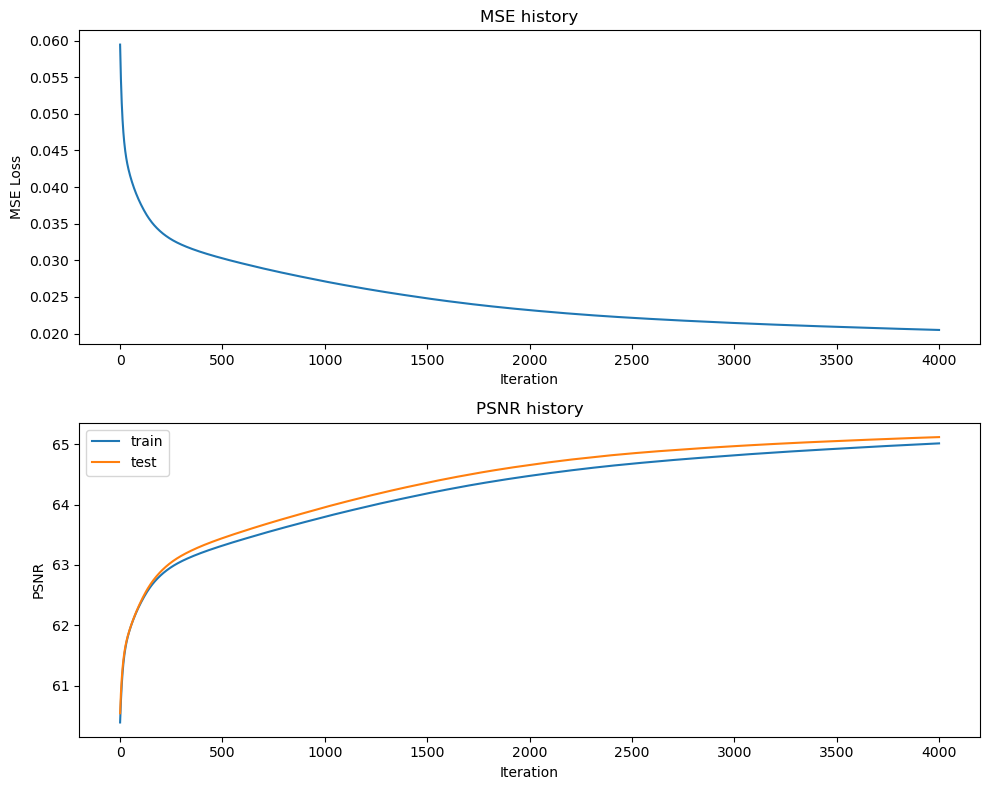

Final Test MSE 0.020001976393098378
Final Test psnr 65.12007450493468


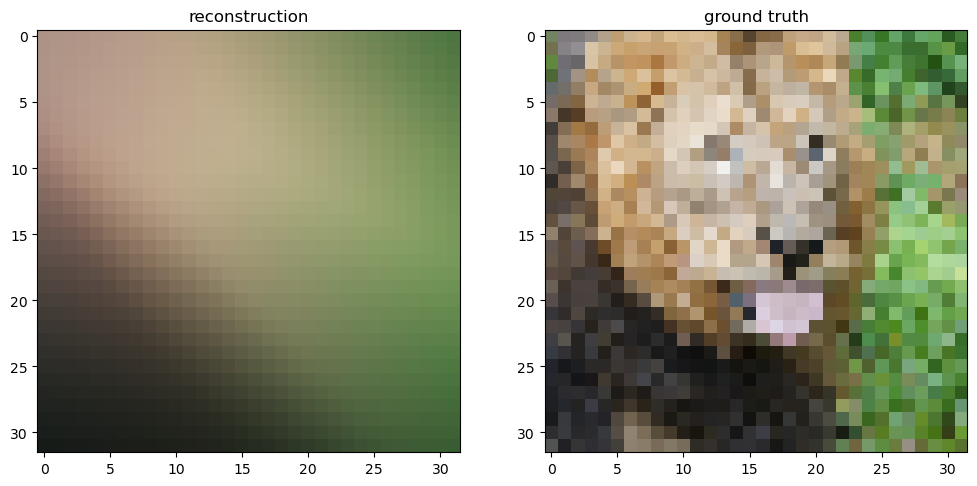

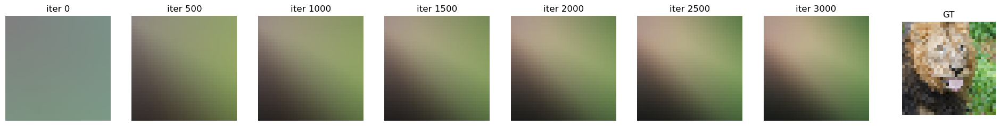

[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

Learning rate: 0.1


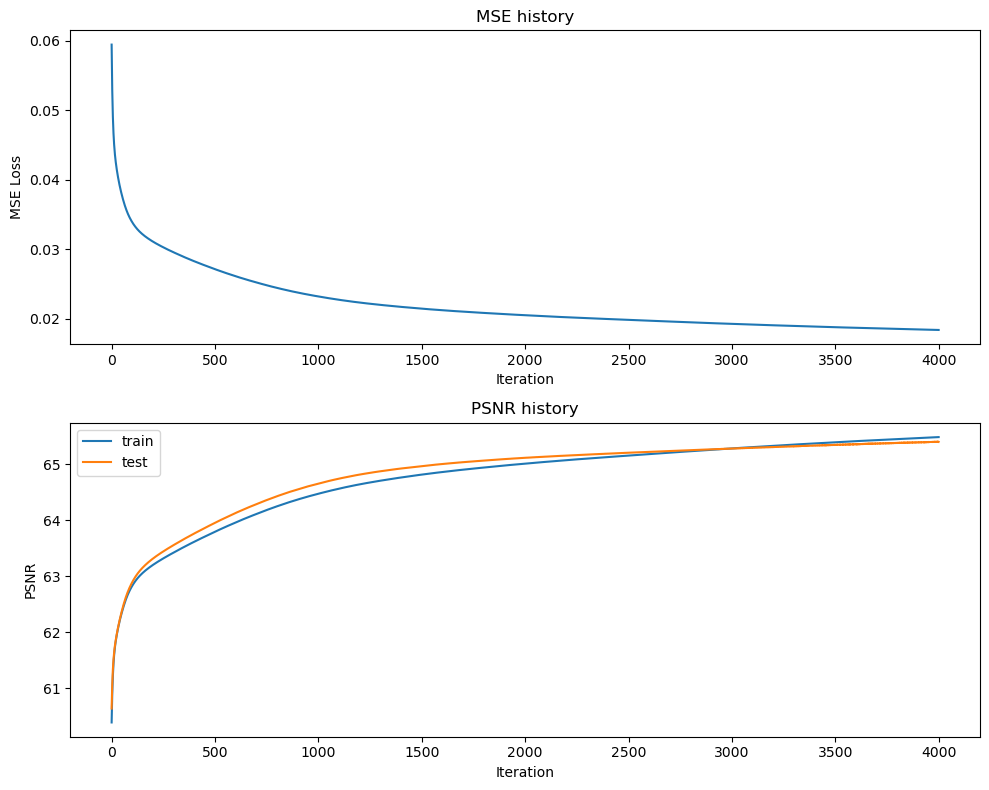

Final Test MSE 0.018737608550372816
Final Test psnr 65.403661990574


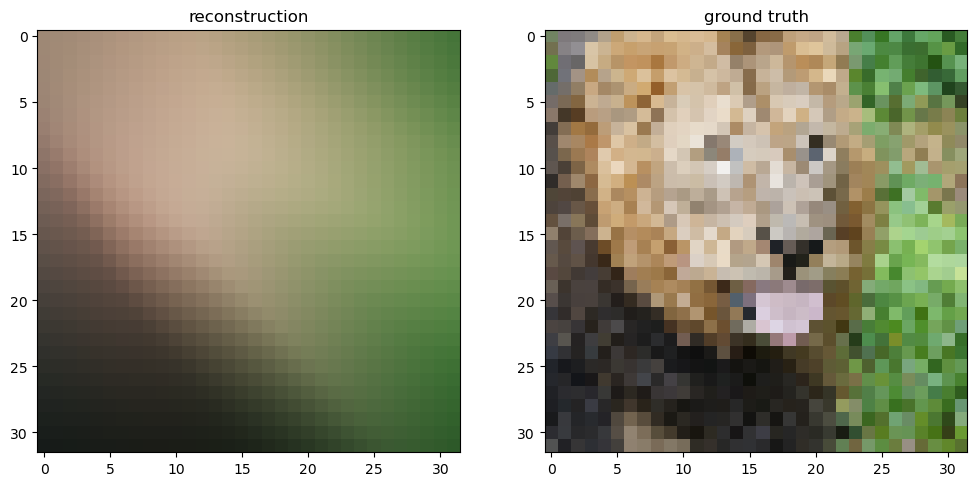

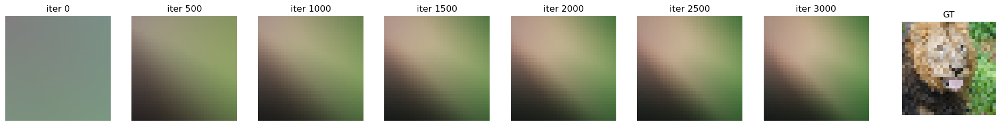

[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

Learning rate: 0.5


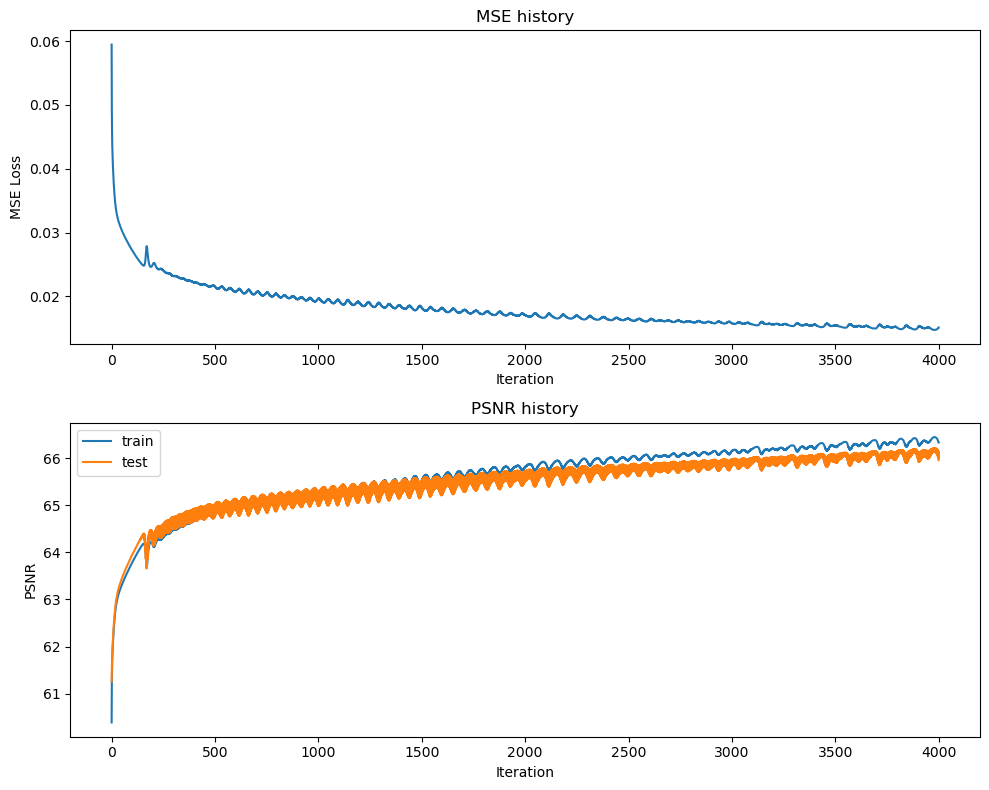

Final Test MSE 0.016495003338971772
Final Test psnr 65.95727953075249


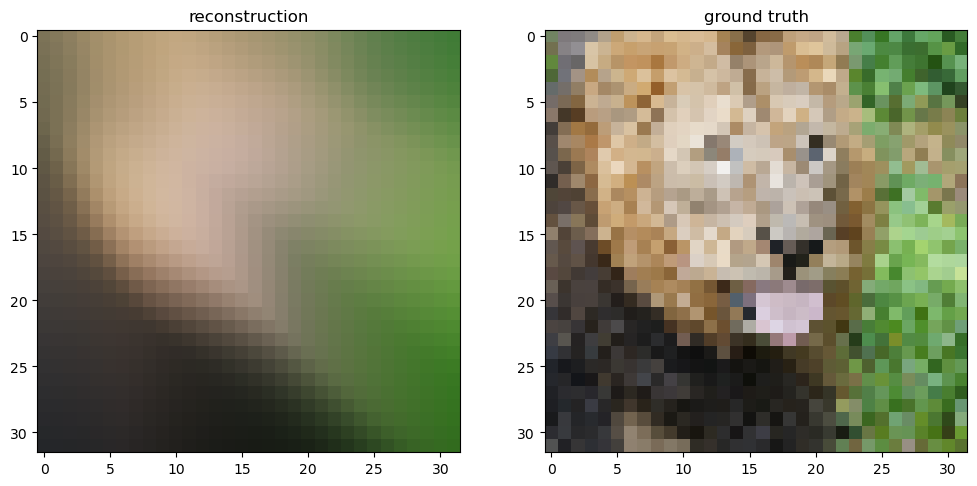

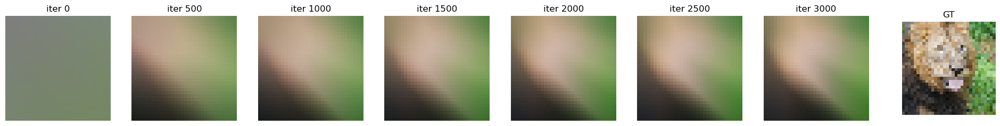

In [15]:
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 4000
learning_rate = .005
output_size = 3
learn=[.001,.005,.0001,.0005,.01,.05, .1, .5]

X_train, y_train, X_test, y_test=get_input_features(B_dict,"none")

np.random.seed(42)
permutation = np.random.permutation(len(X_train))
X_train_shuffled = X_train[permutation]
y_train_shuffled = y_train[permutation]


for l_rate in learn:
    hidden_sizes = [hidden_size] * (num_layers - 1)
    net, train_psnr, test_psnr, train_loss, predicted_images=NN_experiment(X_train_shuffled, y_train_shuffled, X_test, y_test, 2, num_layers,\
                      hidden_size, hidden_sizes, output_size, epochs,\
                      l_rate, "SGD")

    
    print("Learning rate:",l_rate)
    plot_training_curves(train_loss, train_psnr, test_psnr)
    plot_reconstruction(net.forward(X_test), y_test)
    plot_reconstruction_progress(predicted_images, y_test)

In [15]:
def train_wrapper(mapping, size, opt):
  
  num_layers = 5
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  epochs = 4000
  learning_rate = .5
  output_size = 3
  input_size = size

  X_train, y_train, X_test, y_test=get_input_features(B_dict,mapping)

  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(
        X_train, y_train, X_test, y_test, input_size, num_layers, hidden_size, hidden_sizes, output_size, epochs, learning_rate, opt
    )
  return {
      'net': net,
      'train_psnrs': train_psnrs,
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }

In [16]:
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  if k == "none":
        size = 2
  elif k == "basic":
      size = 4
  else:  
      size = 32
  outputs[k] = train_wrapper(k, size, opt="SGD")

  0%|          | 0/5 [00:00<?, ?it/s]

training none
(256, 2) (256, 3) (1024, 2) (1024, 3)
<class 'numpy.ndarray'>
[2, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

training basic
before: (256, 2)
after: (256, 4)
before: (1024, 2)
after: (1024, 4)
(256, 4) (256, 3) (1024, 4) (1024, 3)
<class 'numpy.ndarray'>
[4, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

training gauss_1.0
before: (256, 2)
after: (256, 32)
before: (1024, 2)
after: (1024, 32)
(256, 32) (256, 3) (1024, 32) (1024, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

training gauss_10.0
before: (256, 2)
after: (256, 32)
before: (1024, 2)
after: (1024, 32)
(256, 32) (256, 3) (1024, 32) (1024, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

training gauss_100.0
before: (256, 2)
after: (256, 32)
before: (1024, 2)
after: (1024, 32)
(256, 32) (256, 3) (1024, 32) (1024, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/4000 [00:00<?, ?it/s]

(256, 2) (256, 3) (1024, 2) (1024, 3)
<class 'numpy.ndarray'>
(1024, 3)


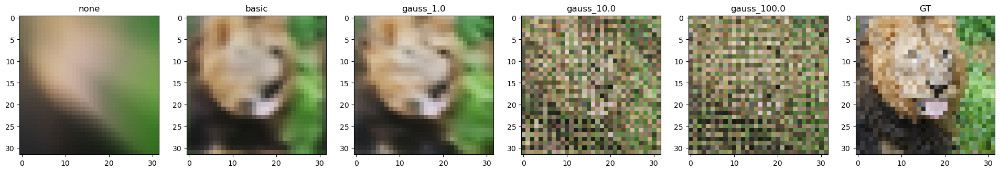

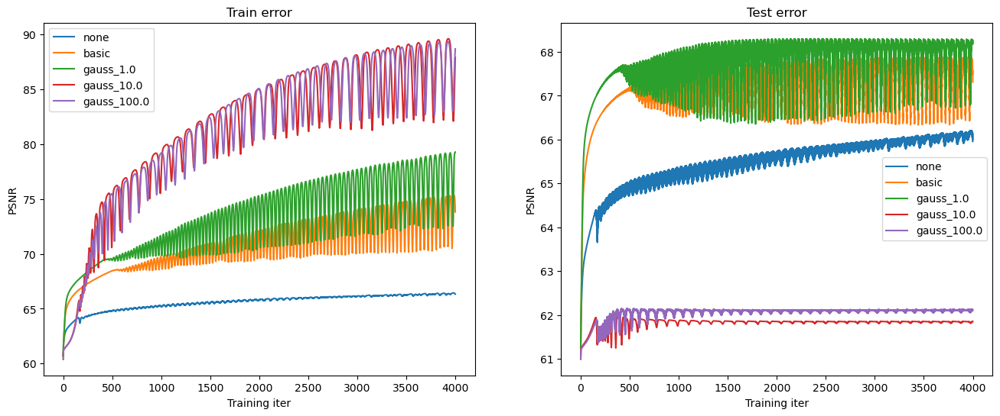

In [18]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
size = 32
X_train, y_train, X_test, y_test=get_input_features(B_dict,"none")
print(y_test.shape)
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

#### Low Resolution Reconstruction - Adam - None Mapping

#### For Multiple Learning Rates

(256, 2) (256, 3) (1024, 2) (1024, 3)
<class 'numpy.ndarray'>
[2, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Learning rate: 0.001


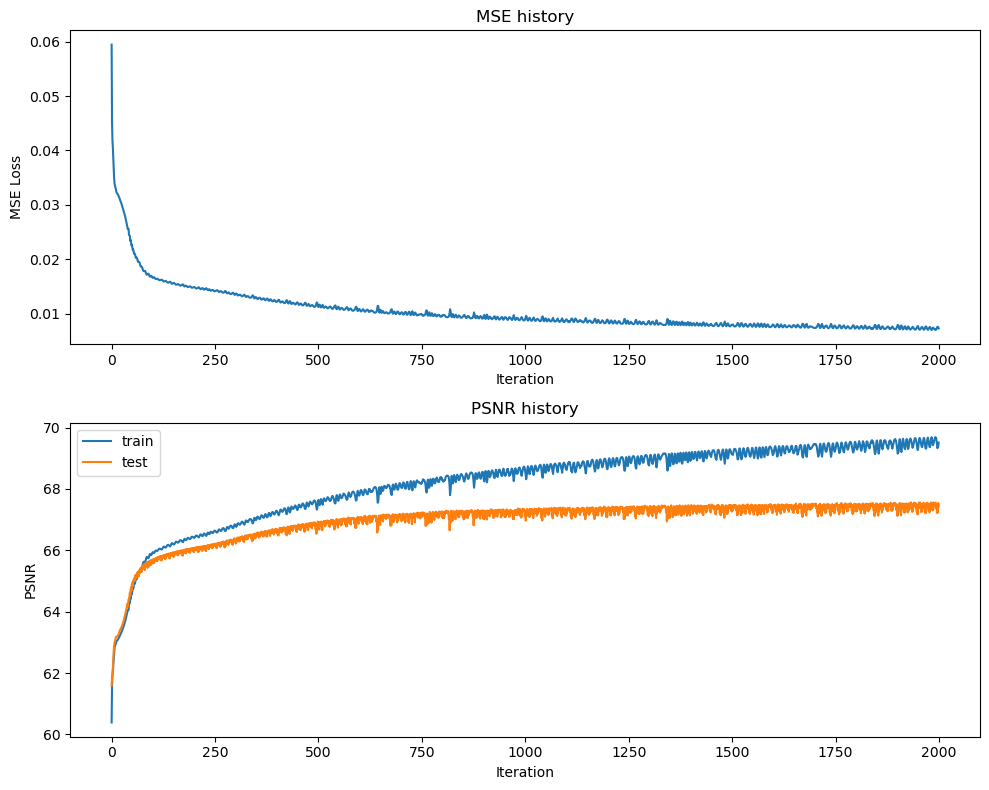

Final Test MSE 0.011726097925168133
Final Test psnr 67.43926844191348


/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3758130134.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


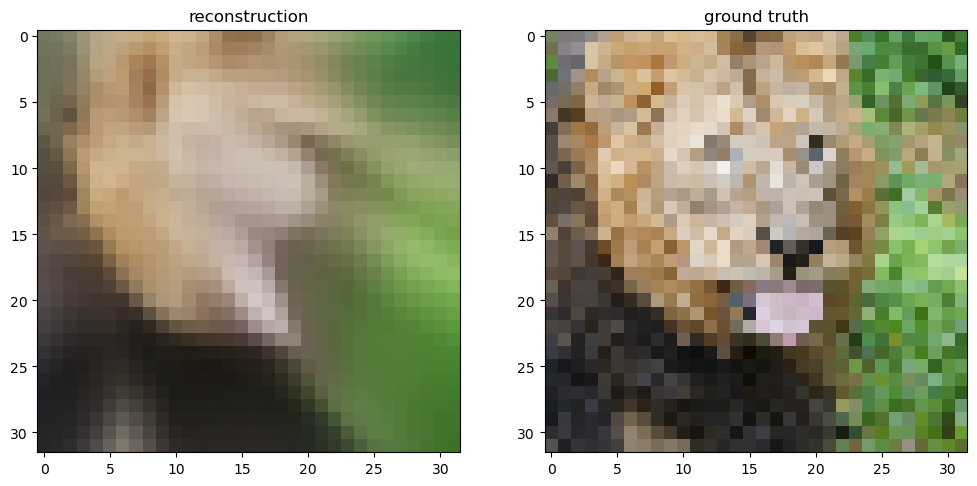

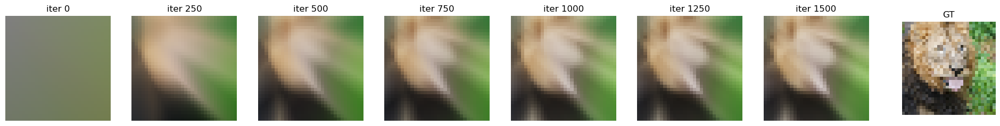

[2, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Learning rate: 0.005


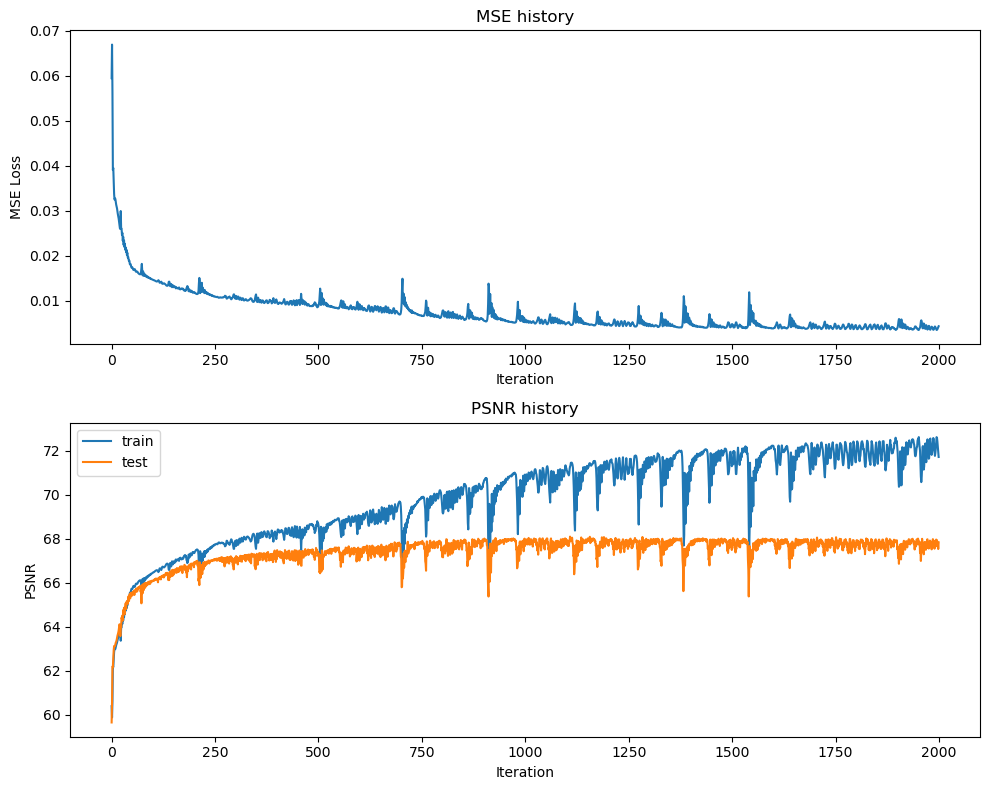

Final Test MSE 0.01069193467057795
Final Test psnr 67.84024064383689


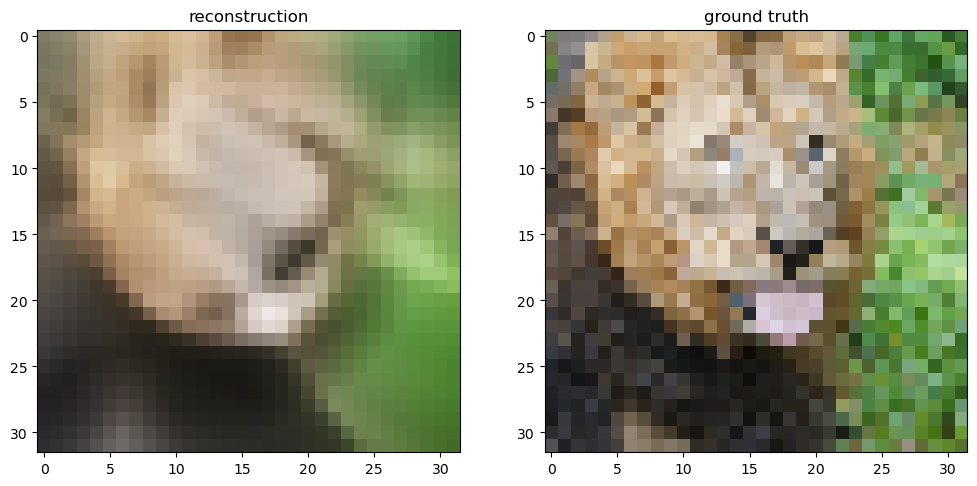

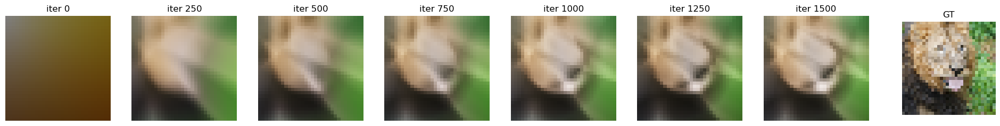

[2, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Learning rate: 0.0001


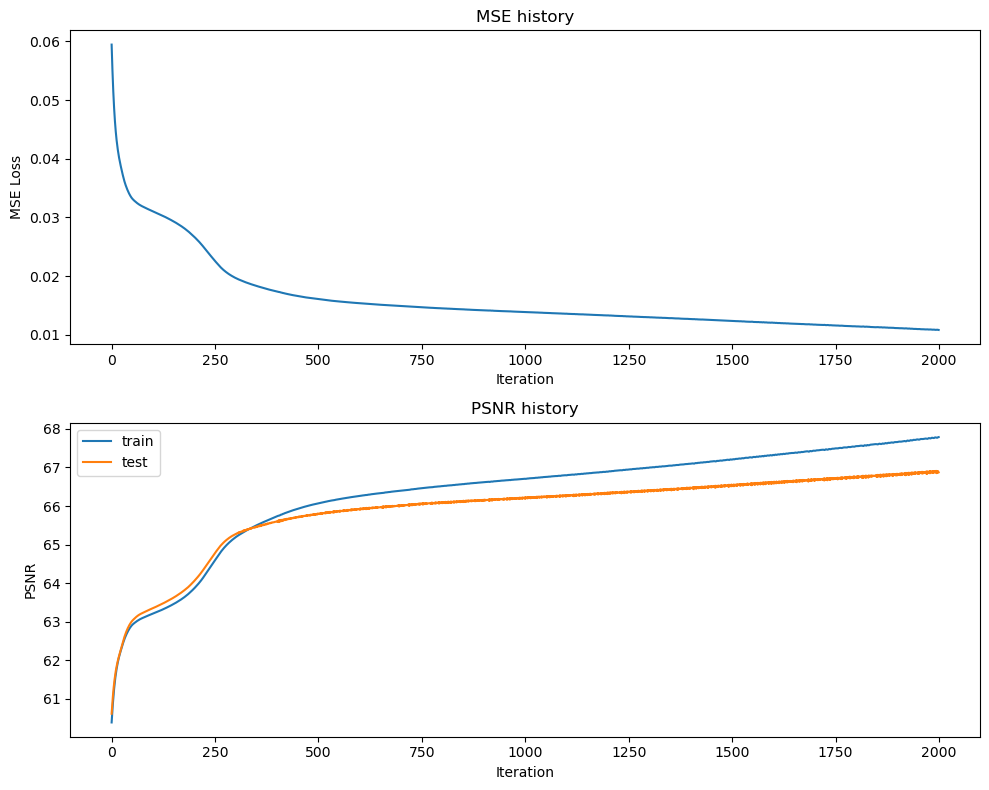

Final Test MSE 0.013361304752338354
Final Test psnr 66.87231491121128


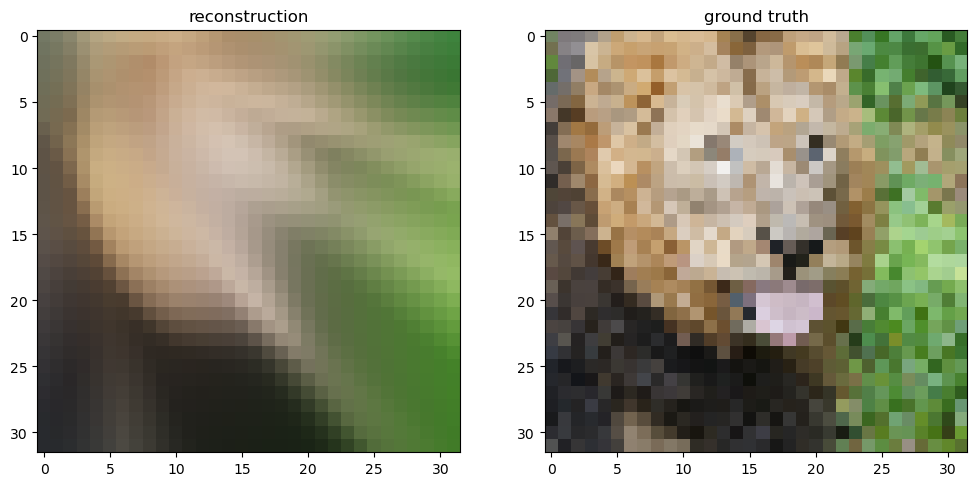

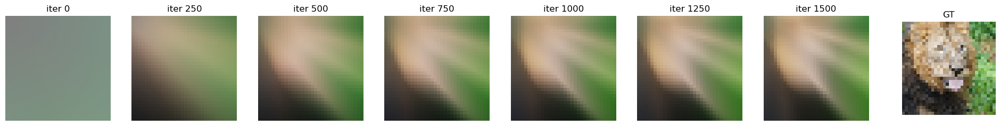

[2, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Learning rate: 0.0005


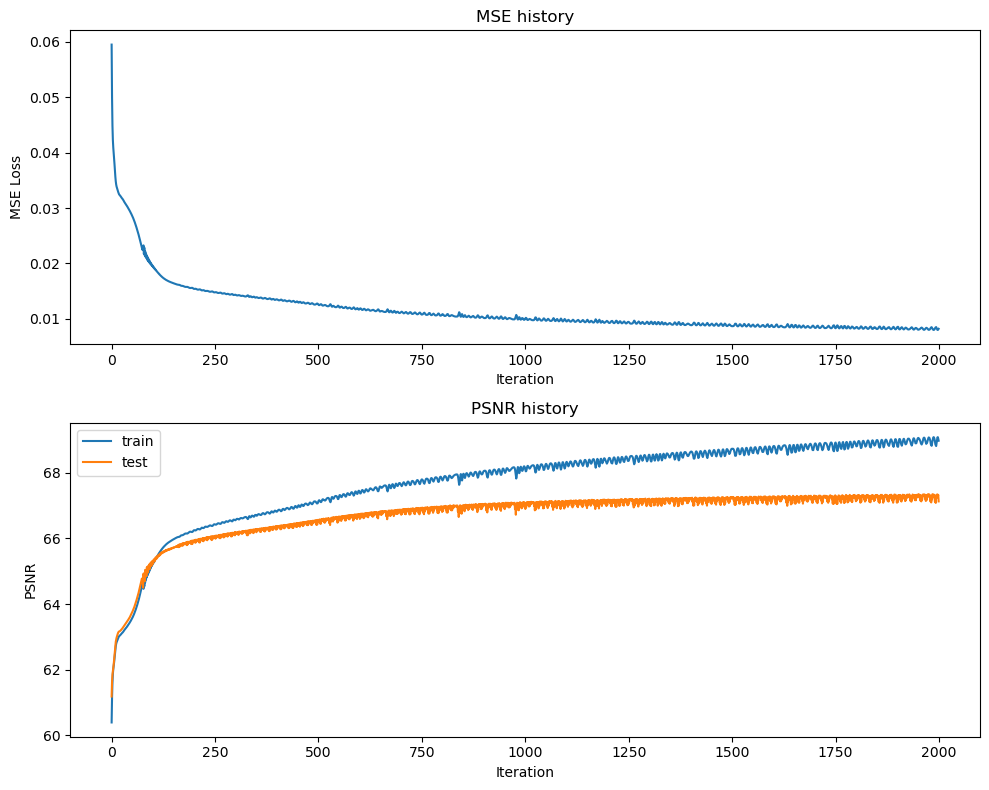

Final Test MSE 0.012591437701100489
Final Test psnr 67.13005039814315


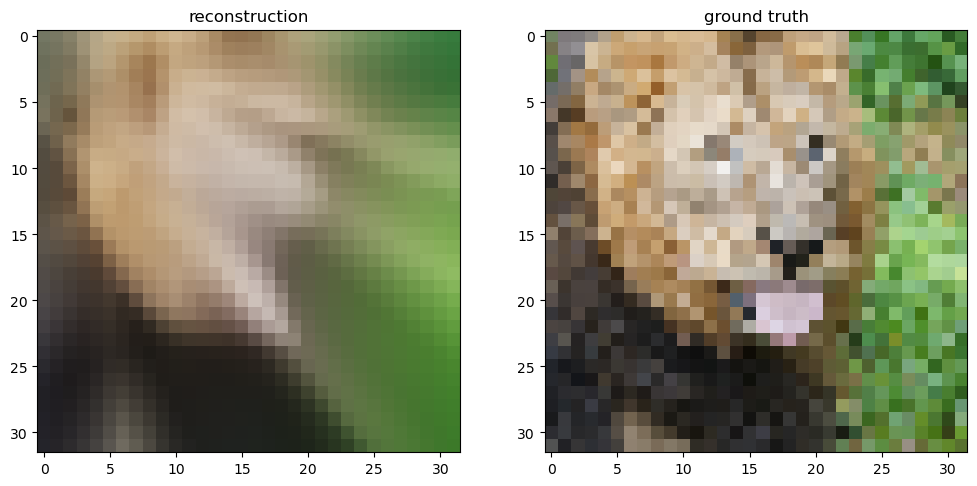

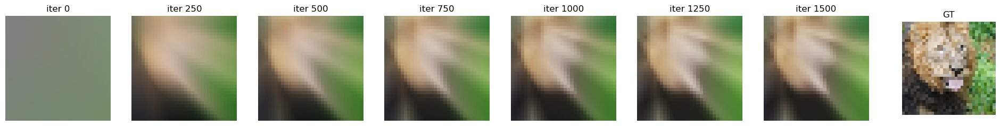

[2, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Learning rate: 0.01


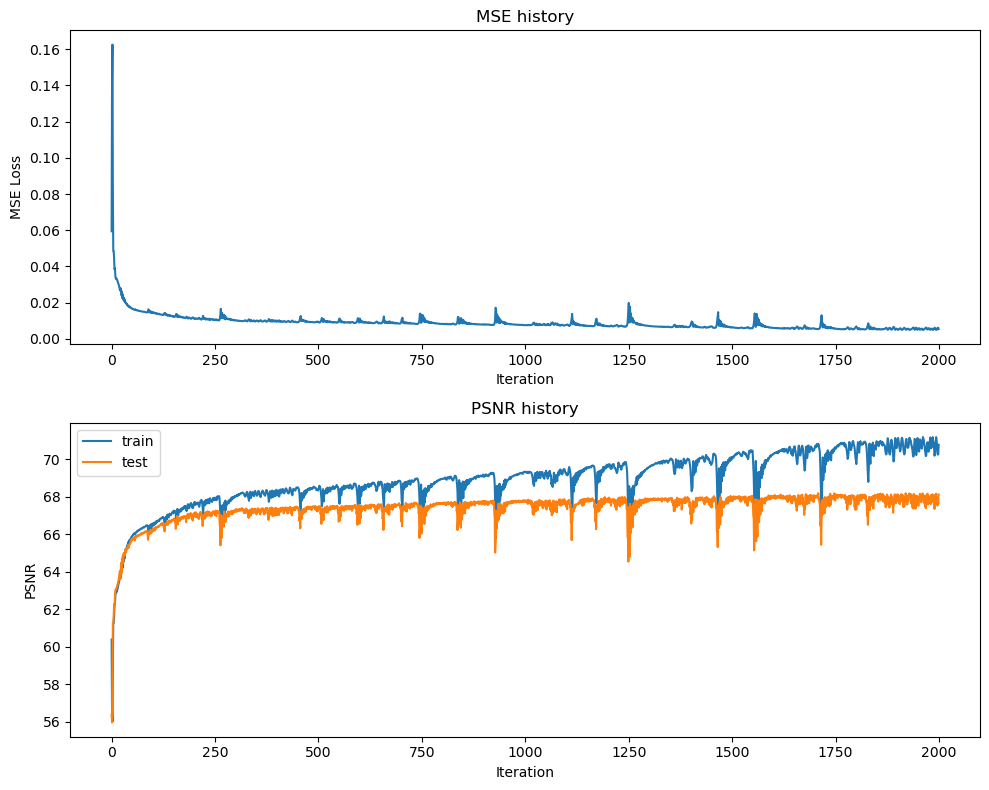

Final Test MSE 0.010023552068162354
Final Test psnr 68.12058710171517


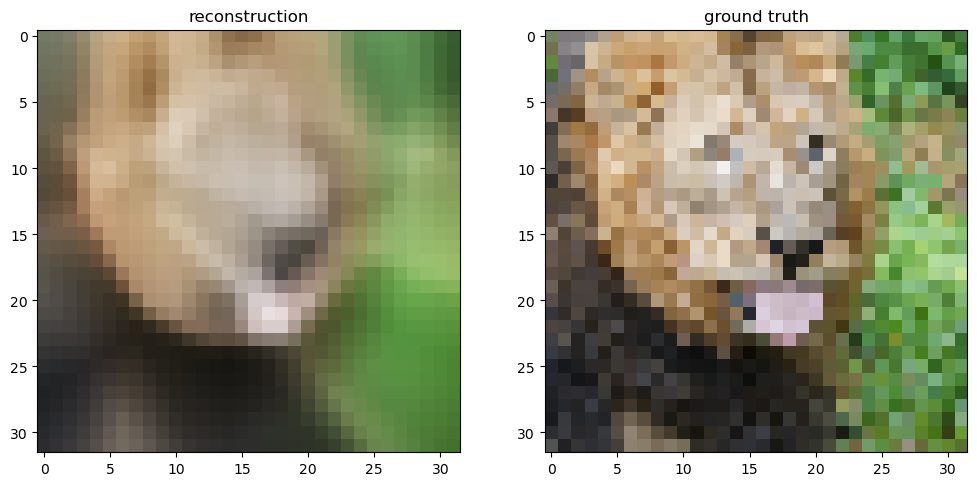

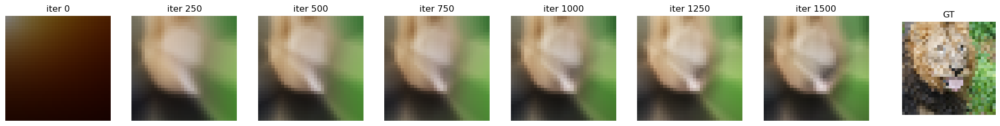

[2, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

/Users/panshuljindal/Downloads/CS_444_Assignment2/models/neural_net.py:119: RuntimeWarning: overflow encountered in exp
  sig = np.where(x >= 0, 1 / (1 + np.exp(-x)), np.exp(x) / (1 + np.exp(x)))


Learning rate: 0.05


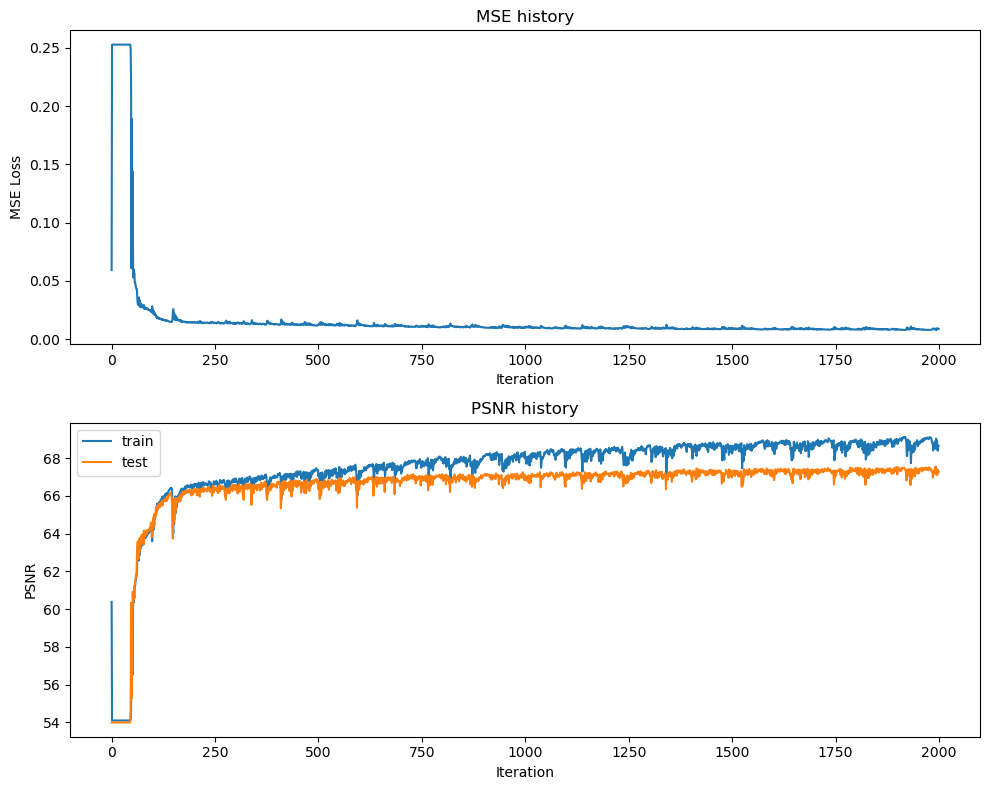

Final Test MSE 0.012159488866041965
Final Test psnr 67.28165041467628


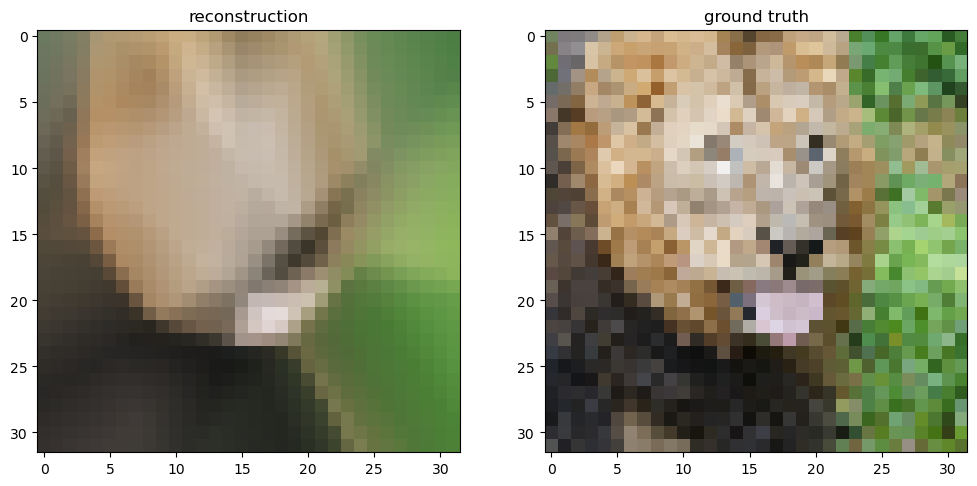

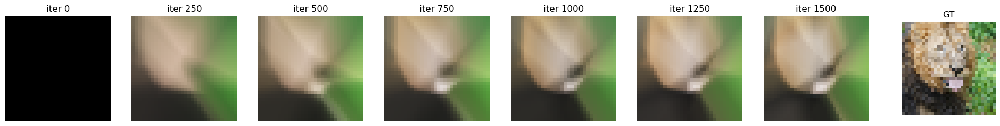

In [25]:
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 2000

learn=[.001,.005,.0001,.0005,.01,.05]
output_size = 3

X_train, y_train, X_test, y_test=get_input_features(B_dict,"none")


for l_rate in learn:
    hidden_sizes = [hidden_size] * (num_layers - 1)
    net, train_psnr, test_psnr, train_loss, predicted_images=NN_experiment(X_train_shuffled, y_train_shuffled, X_test, y_test, 2, num_layers,\
                      hidden_size, hidden_sizes, output_size, epochs,\
                      l_rate, "Adam")

    
    print("Learning rate:",l_rate)
    plot_training_curves(train_loss, train_psnr, test_psnr)
    plot_reconstruction(net.forward(X_test), y_test)
    plot_reconstruction_progress(predicted_images, y_test)

#### For Multiple Layers

(256, 2) (256, 3) (1024, 2) (1024, 3)
<class 'numpy.ndarray'>
[2, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Number of Layers: 5
Learning rate: 0.005


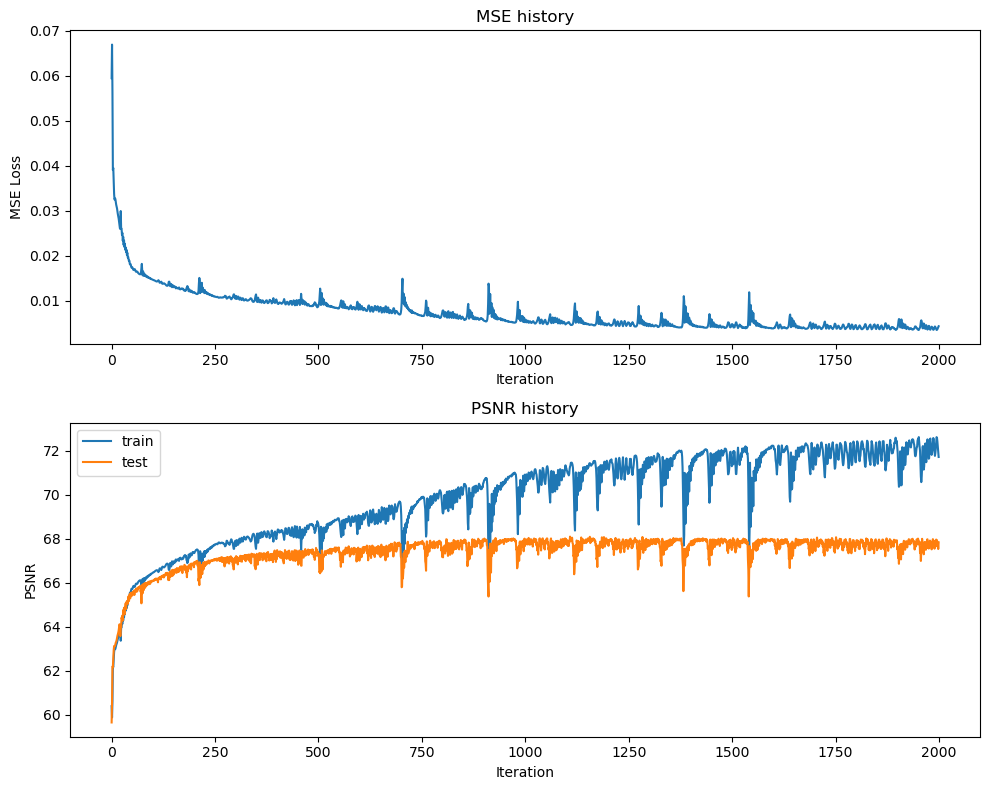

Final Test MSE 0.01069193467057795
Final Test psnr 67.84024064383689


/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3758130134.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


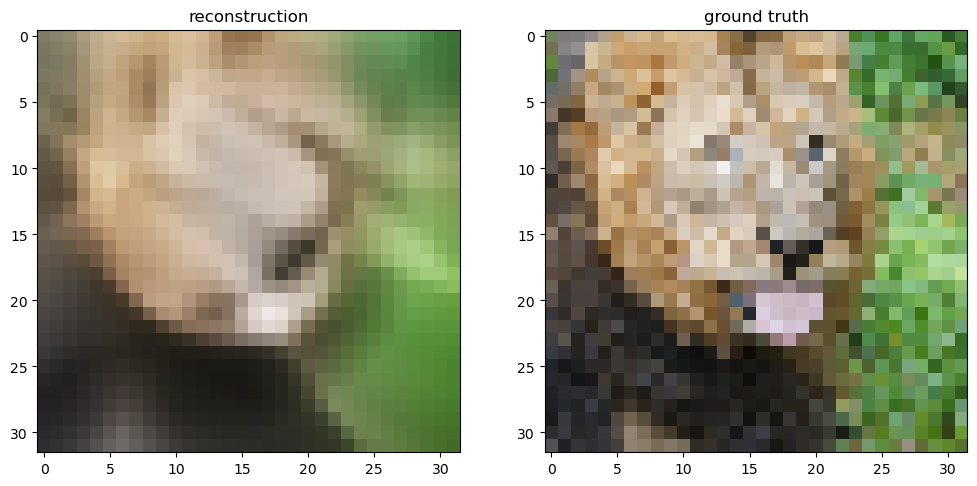

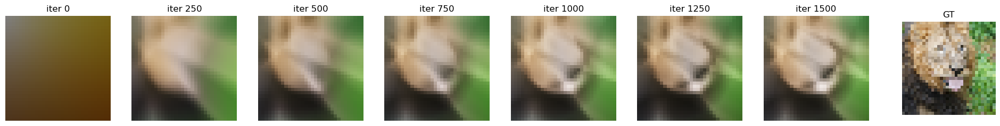

[2, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Number of Layers: 5
Learning rate: 0.01


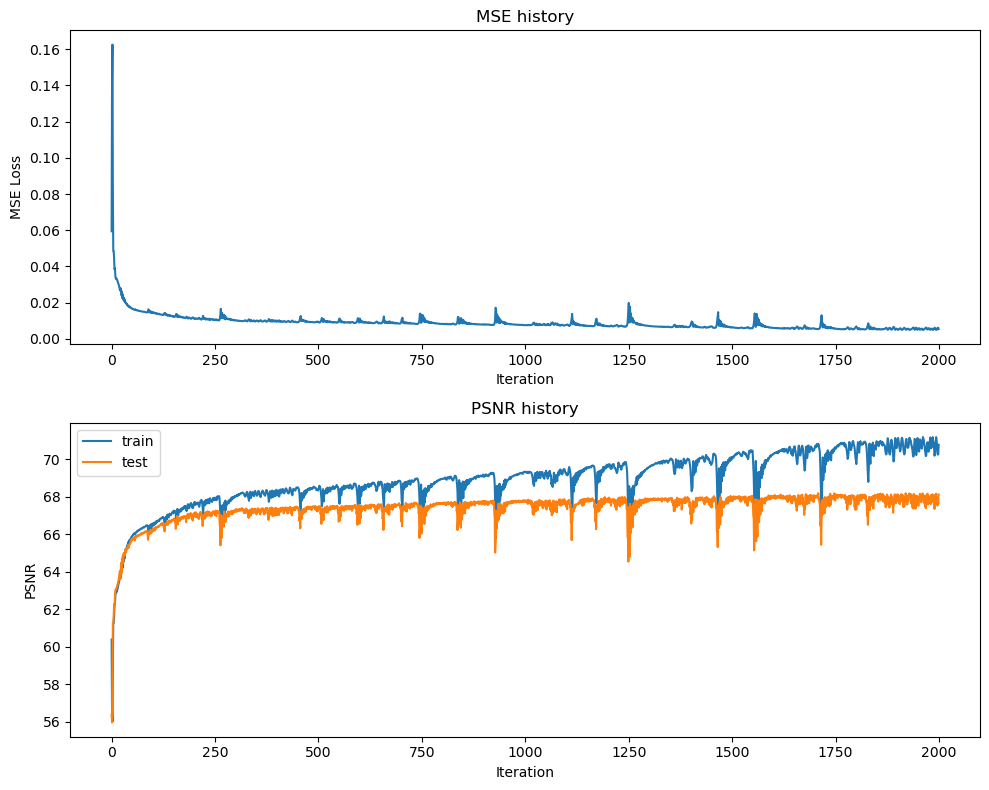

Final Test MSE 0.010023552068162354
Final Test psnr 68.12058710171517


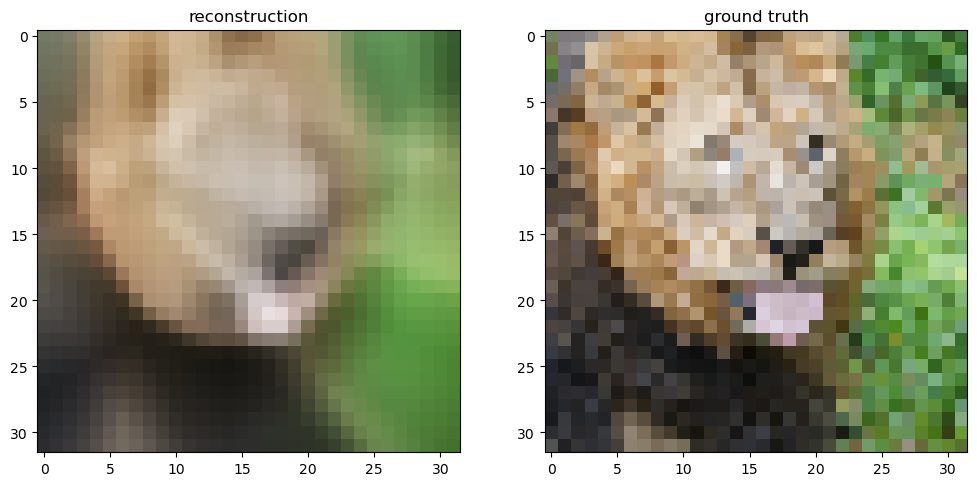

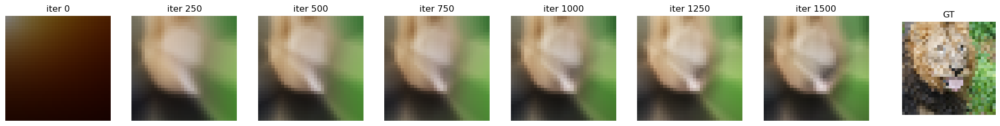

[2, 256, 256, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Number of Layers: 7
Learning rate: 0.005


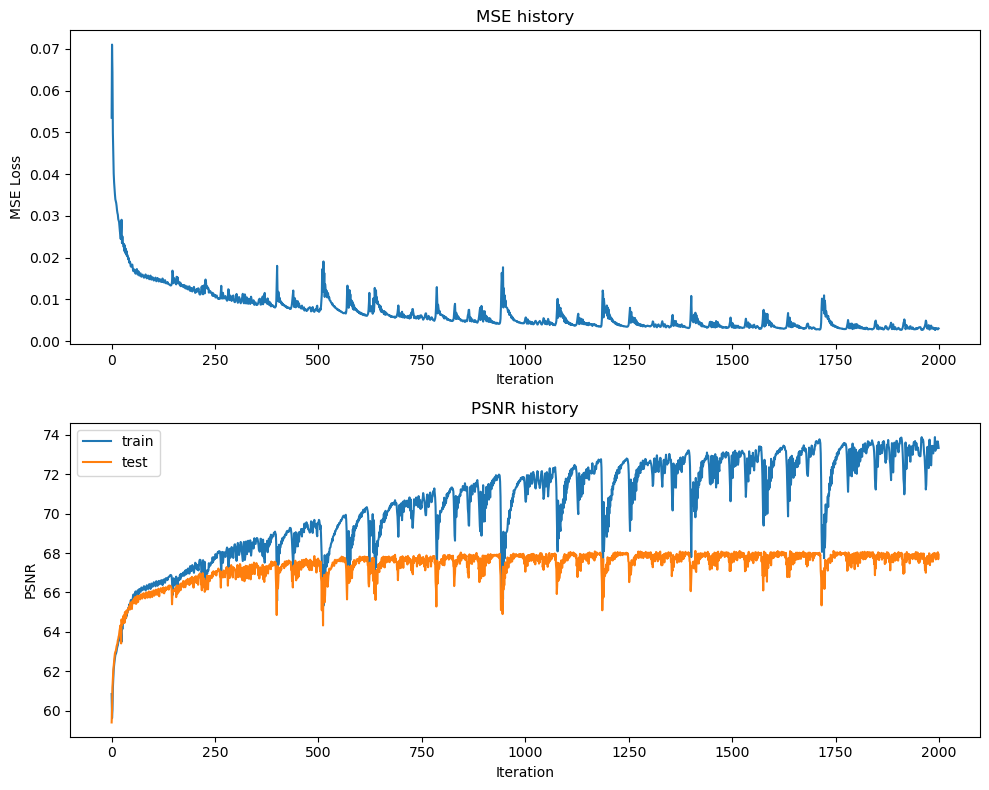

Final Test MSE 0.010488936509617852
Final Test psnr 67.92348904268108


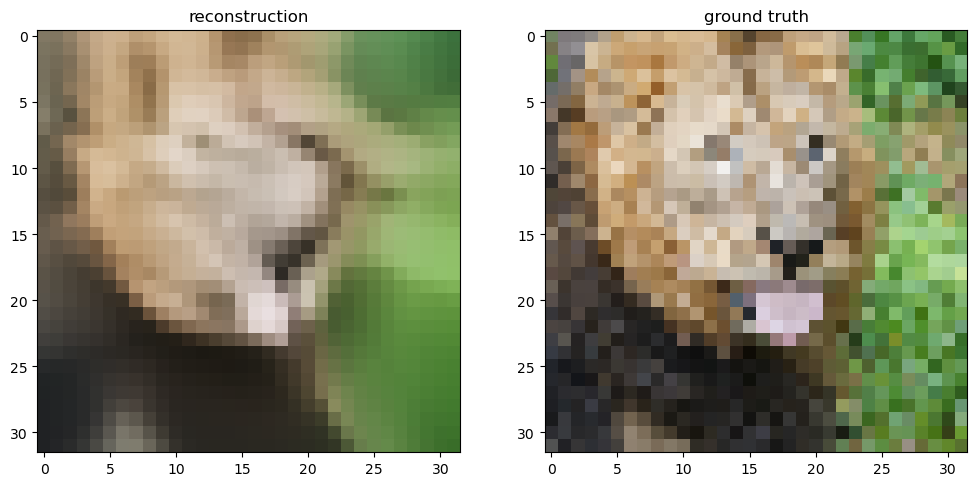

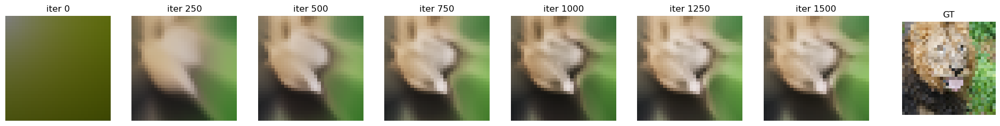

[2, 256, 256, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Number of Layers: 7
Learning rate: 0.01


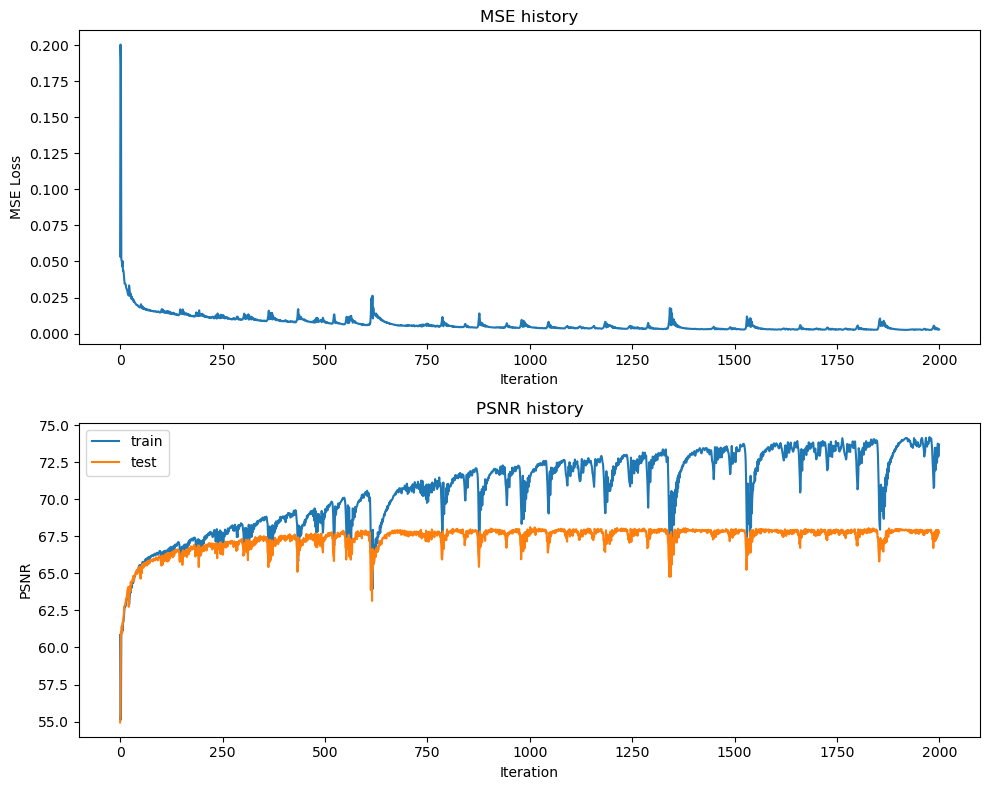

Final Test MSE 0.010962010484648501
Final Test psnr 67.73190147749243


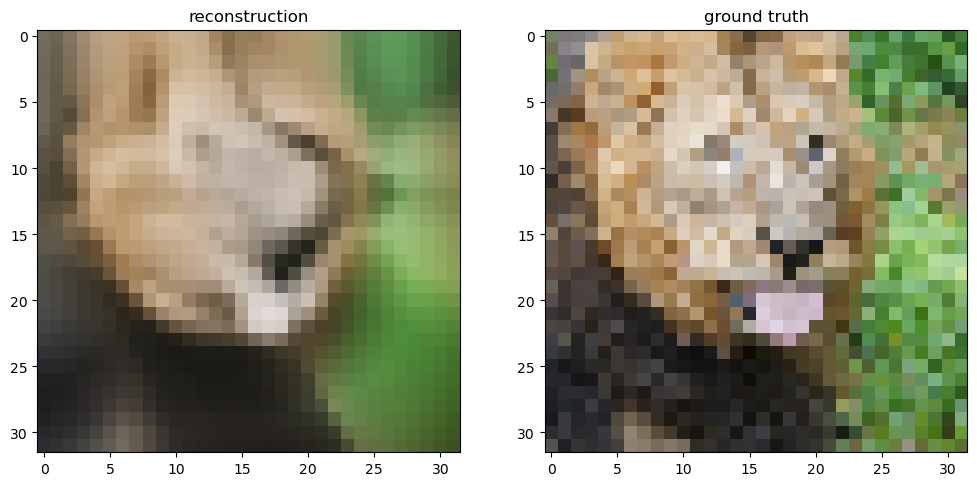

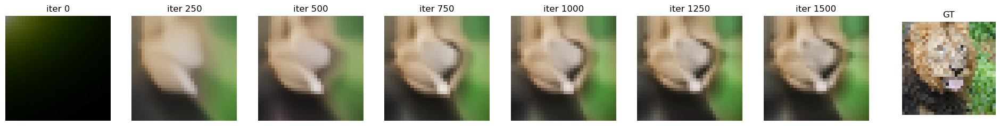

[2, 256, 256, 256, 256, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Number of Layers: 9
Learning rate: 0.005


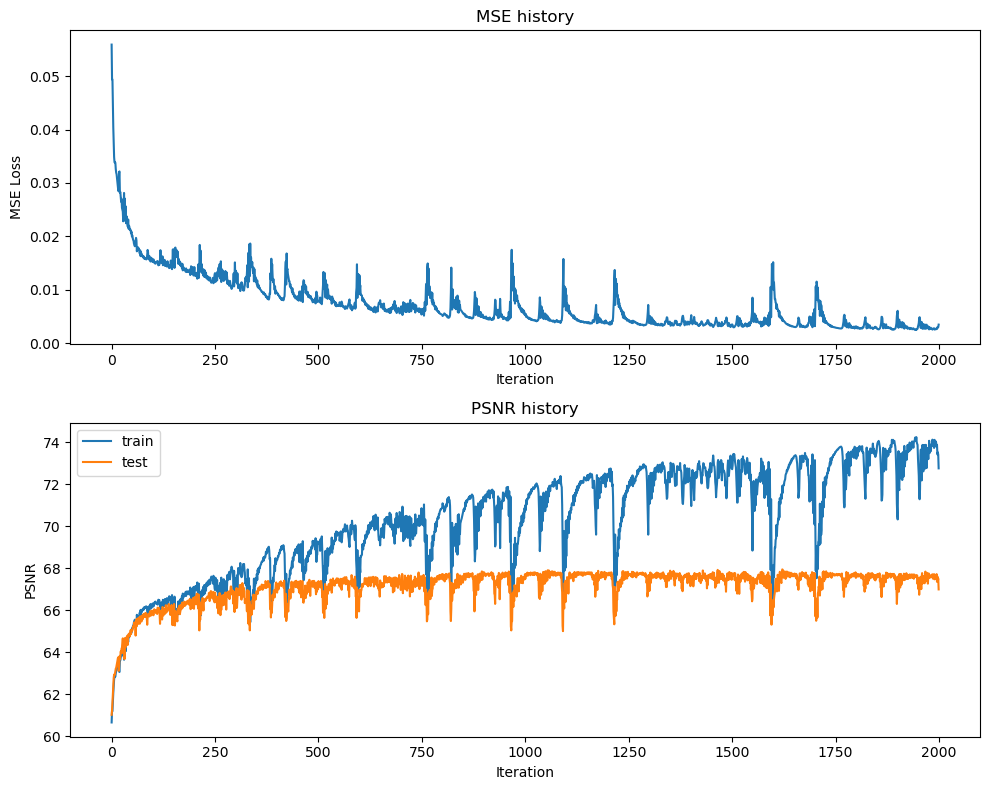

Final Test MSE 0.013006030914139668
Final Test psnr 66.9893557891675


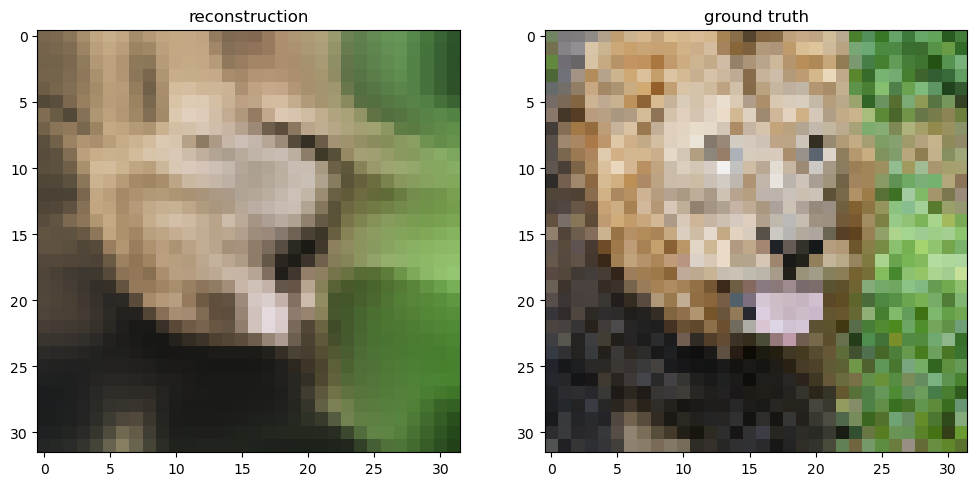

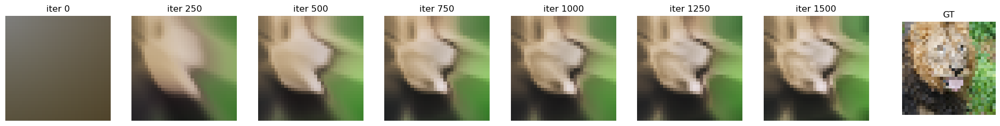

[2, 256, 256, 256, 256, 256, 256, 256, 256, 3]


  0%|          | 0/2000 [00:00<?, ?it/s]

Number of Layers: 9
Learning rate: 0.01


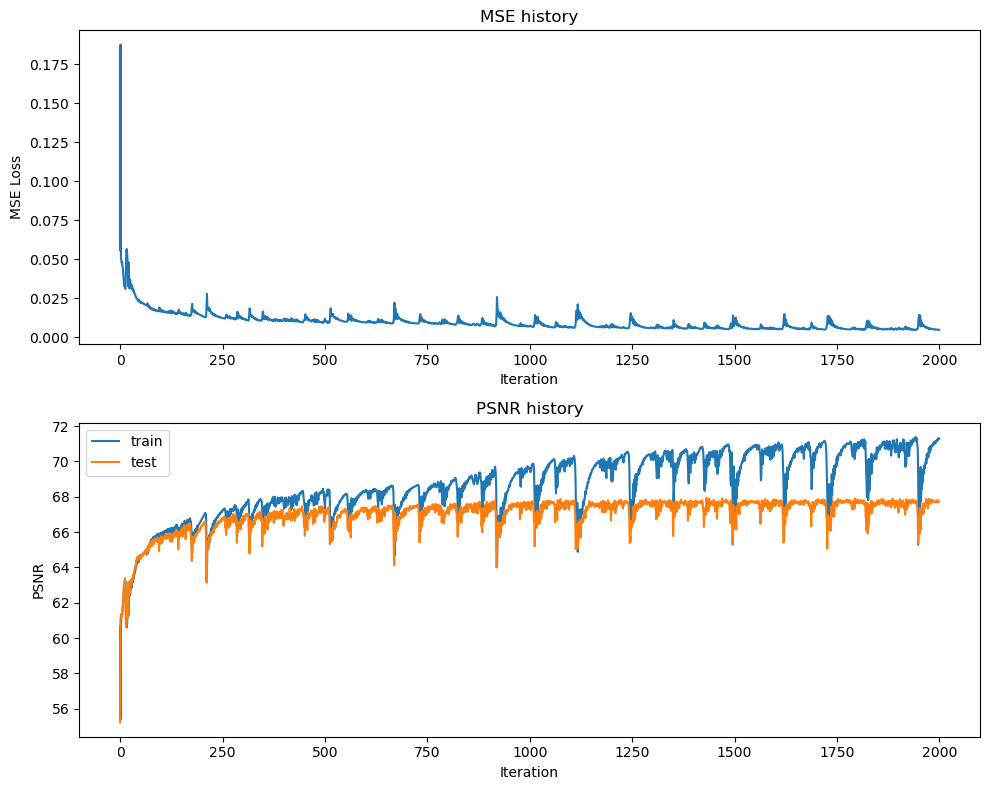

Final Test MSE 0.011006412303947886
Final Test psnr 67.71434583269064


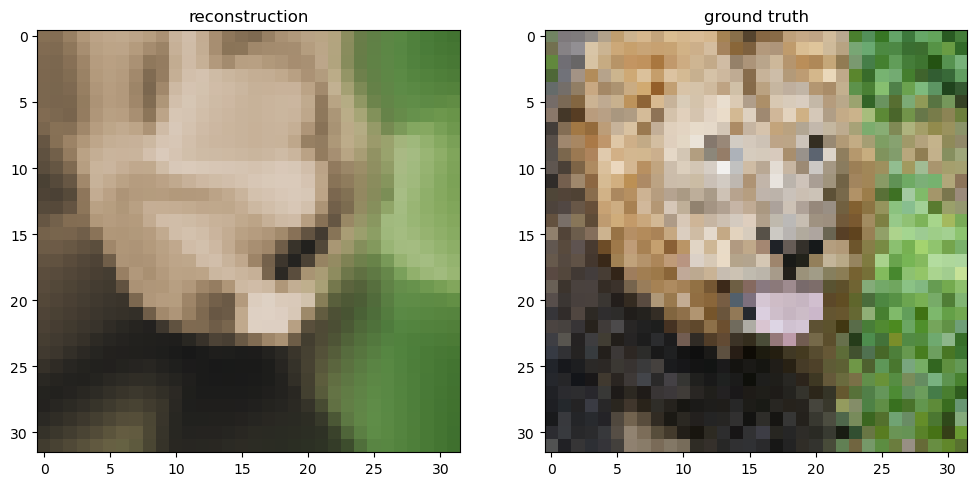

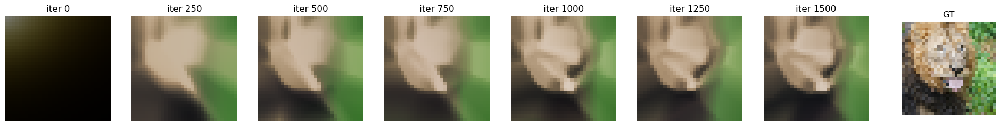

In [121]:
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 2000
learn=[.005,.01]
num_layer=[5,7,9]
output_size = 3

X_train, y_train, X_test, y_test=get_input_features(B_dict,"none")


for num in num_layer:
    for l_rate in learn:
        hidden_sizes = [hidden_size] * (num - 1)
        net, train_psnr, test_psnr, train_loss, predicted_images=NN_experiment(X_train_shuffled, y_train_shuffled, X_test, y_test, 2, num,\
                          hidden_size, hidden_sizes, output_size, epochs,\
                          l_rate, "Adam")

        
        print("Number of Layers:",num)
        print("Learning rate:",l_rate)
        plot_training_curves(train_loss, train_psnr, test_psnr)
        plot_reconstruction(net.forward(X_test), y_test)
        plot_reconstruction_progress(predicted_images, y_test)

In [122]:
def train_wrapper(mapping, size, opt):
  
  num_layers = 5
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  epochs = 3000
  learning_rate = .005
  output_size = 3
  input_size = size

  X_train, y_train, X_test, y_test=get_input_features(B_dict,mapping)

  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(
        X_train, y_train, X_test, y_test, input_size, num_layers, hidden_size, hidden_sizes, output_size, epochs, learning_rate, opt
    )
  return {
      'net': net,
      'train_psnrs': train_psnrs,
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }

In [123]:
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  if k == "none":
        size = 2
  elif k == "basic":
      size = 4
  else:  
      size = 32
  outputs[k] = train_wrapper(k, size, opt="Adam")

  0%|          | 0/5 [00:00<?, ?it/s]

training none
(256, 2) (256, 3) (1024, 2) (1024, 3)
<class 'numpy.ndarray'>
[2, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training basic
before: (256, 2)
after: (256, 4)
before: (1024, 2)
after: (1024, 4)
(256, 4) (256, 3) (1024, 4) (1024, 3)
<class 'numpy.ndarray'>
[4, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_1.0
before: (256, 2)
after: (256, 32)
before: (1024, 2)
after: (1024, 32)
(256, 32) (256, 3) (1024, 32) (1024, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_10.0
before: (256, 2)
after: (256, 32)
before: (1024, 2)
after: (1024, 32)
(256, 32) (256, 3) (1024, 32) (1024, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_100.0
before: (256, 2)
after: (256, 32)
before: (1024, 2)
after: (1024, 32)
(256, 32) (256, 3) (1024, 32) (1024, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

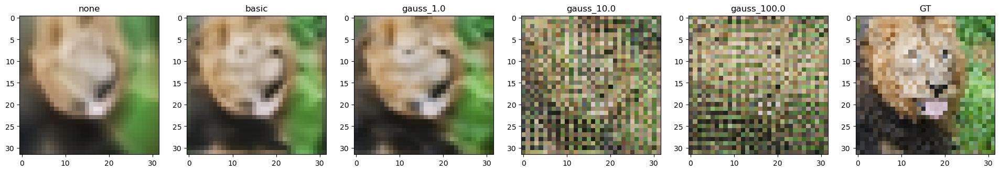

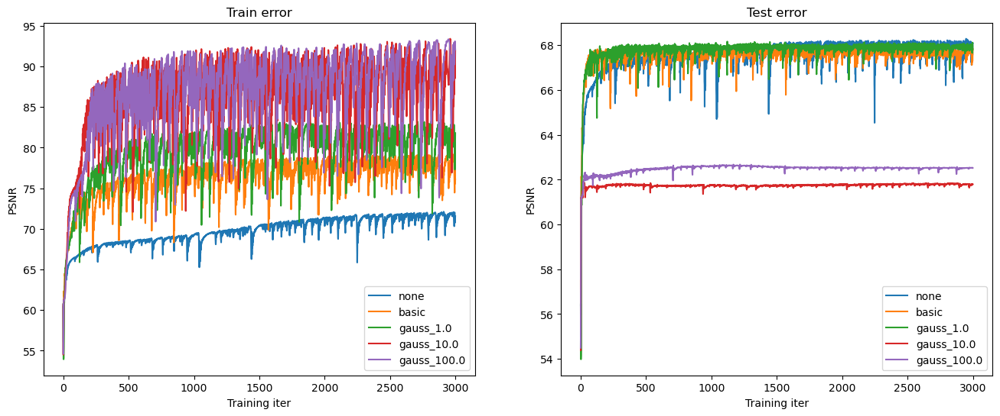

In [124]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

# High Resolution Reconstruction

/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3893910640.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


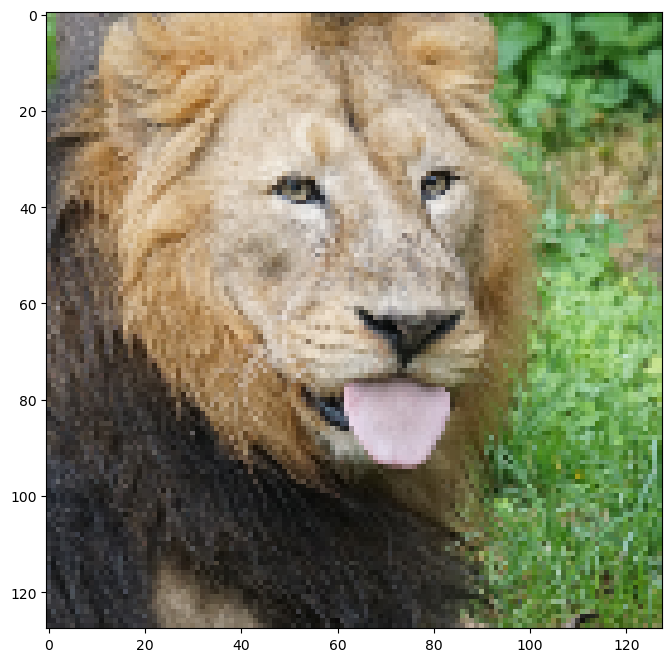

In [126]:
size = 128
train_data, test_data = get_image(size)

#### Experiment on High Resolution Image for Gaussian 1.0

before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

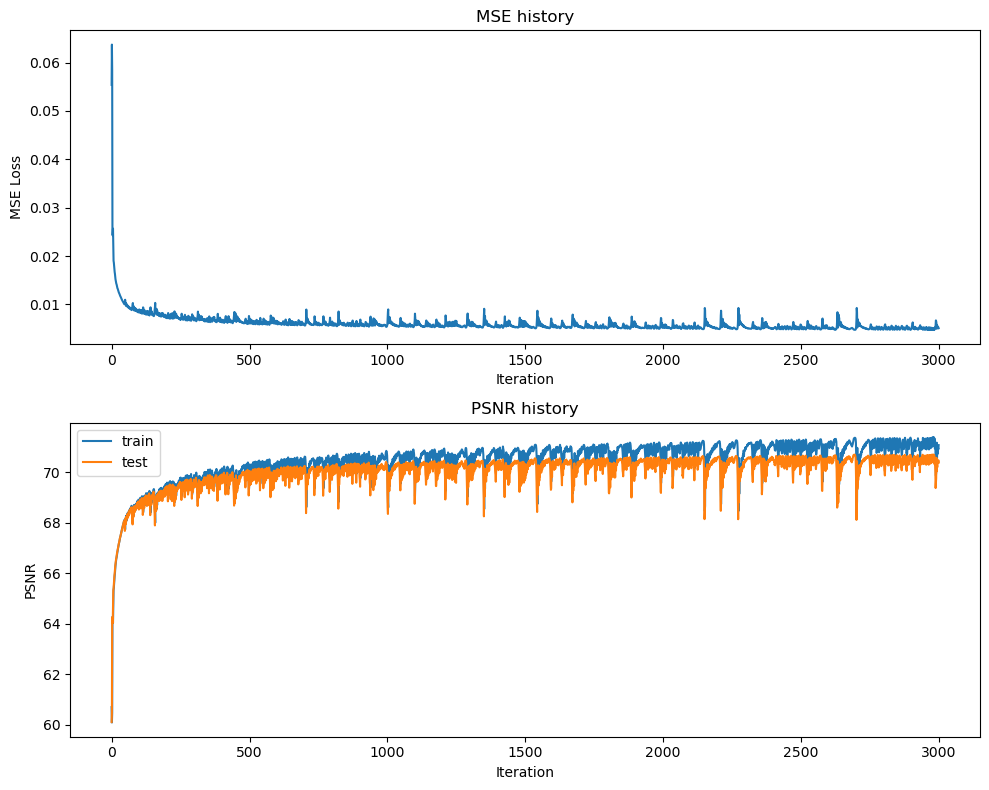

Final Test MSE 0.005950274332717099
Final Test psnr 70.38543371872345


/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_27910/3758130134.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


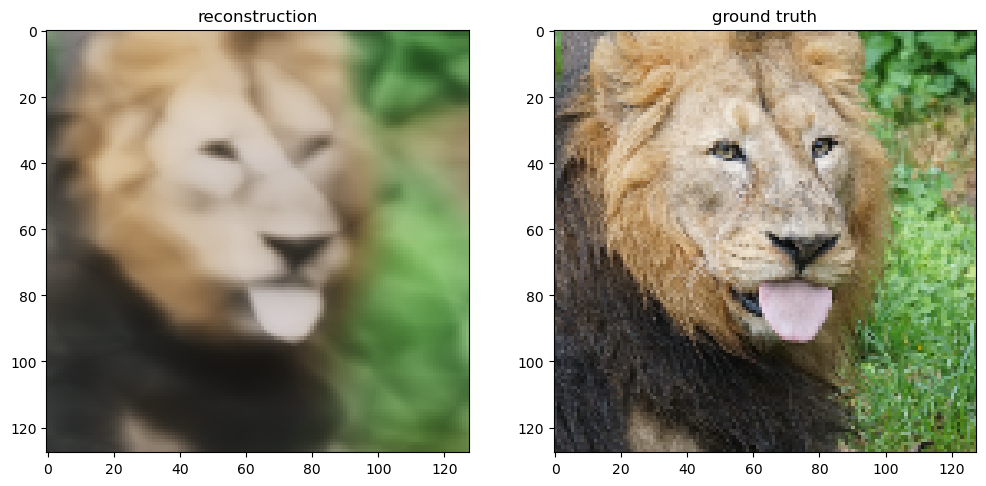

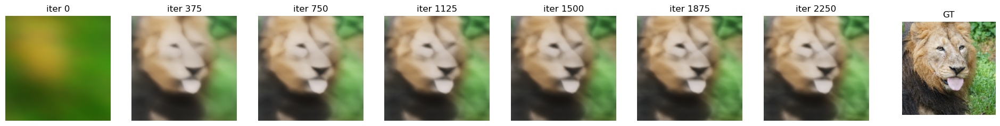

In [58]:
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 3000
learning_rate = .005
output_size = 3

X_train, y_train, X_test, y_test=get_input_features(B_dict,"gauss_1.0")


net, train_psnr, test_psnr, train_loss, predicted_images=NN_experiment(X_train, y_train, X_test, y_test, 32, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt="Adam")
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### Experiment on High Resolution Image for Gaussian 10.0

before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

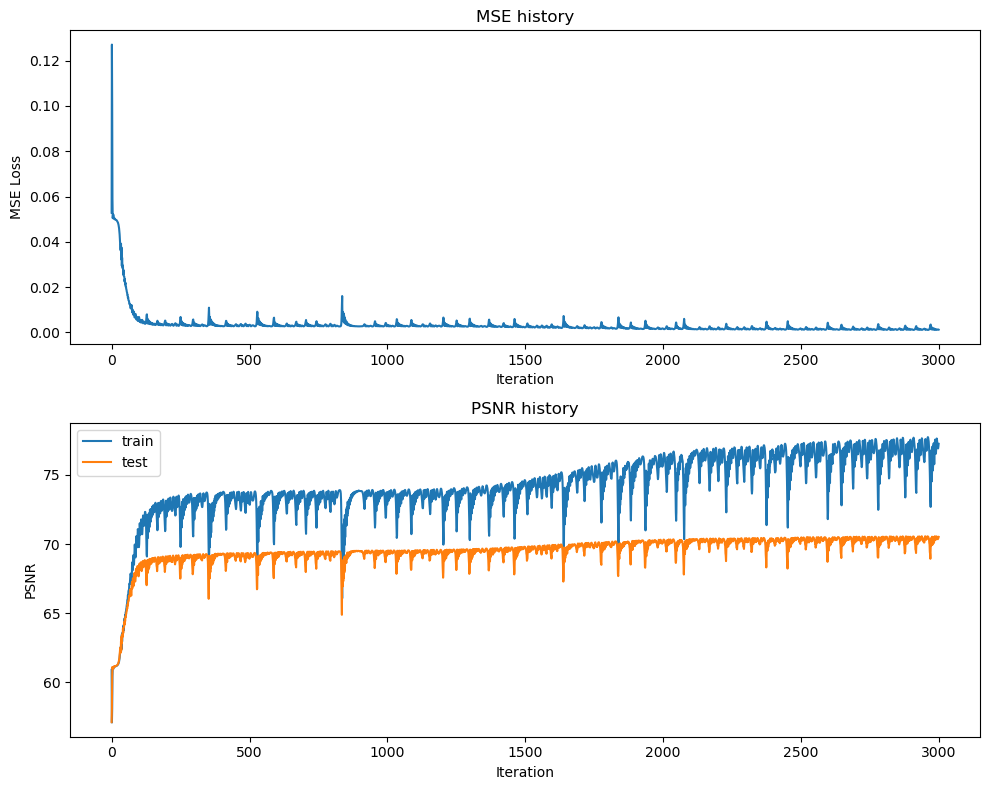

Final Test MSE 0.005769346411569003
Final Test psnr 70.51953744579869


/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_27910/3758130134.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


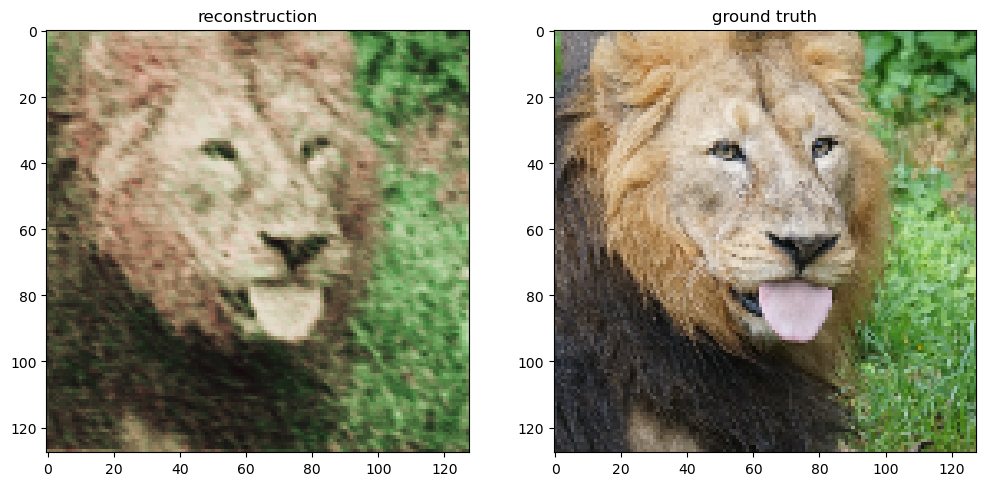

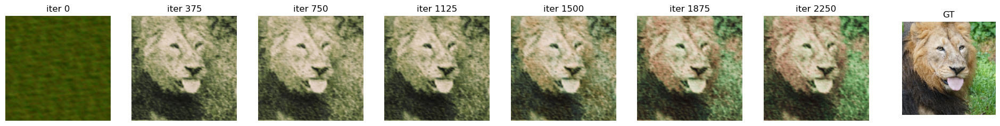

In [59]:
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 3000
learning_rate = .005
output_size = 3

X_train, y_train, X_test, y_test=get_input_features(B_dict,"gauss_10.0")


net, train_psnr, test_psnr, train_loss, predicted_images=NN_experiment(X_train, y_train, X_test, y_test, 32, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt="Adam")
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### Training for all types of Feature Mapping

In [127]:
def train_wrapper(mapping, size, opt):

  num_layers = 5
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  epochs = 3000
  learning_rate = .005
  output_size = 3
  input_size = size

  X_train, y_train, X_test, y_test=get_input_features(B_dict,mapping)

  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(
        X_train, y_train, X_test, y_test, input_size, num_layers, hidden_size, hidden_sizes, output_size, epochs, learning_rate, opt
    )
  return {
      'net': net,
      'train_psnrs': train_psnrs,
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }

In [128]:
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  if k == "none":
        size = 2
  elif k == "basic":
      size = 4
  else:  
      size = 32
  outputs[k] = train_wrapper(k, size, opt="Adam")

  0%|          | 0/5 [00:00<?, ?it/s]

training none
(4096, 2) (4096, 3) (16384, 2) (16384, 3)
<class 'numpy.ndarray'>
[2, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training basic
before: (4096, 2)
after: (4096, 4)
before: (16384, 2)
after: (16384, 4)
(4096, 4) (4096, 3) (16384, 4) (16384, 3)
<class 'numpy.ndarray'>
[4, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_1.0
before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_10.0
before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_100.0
before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

(4096, 2) (4096, 3) (16384, 2) (16384, 3)
<class 'numpy.ndarray'>
(16384, 3)


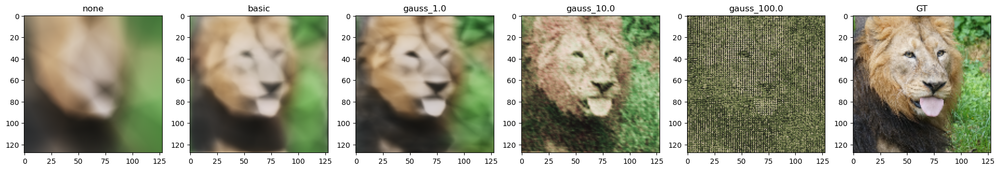

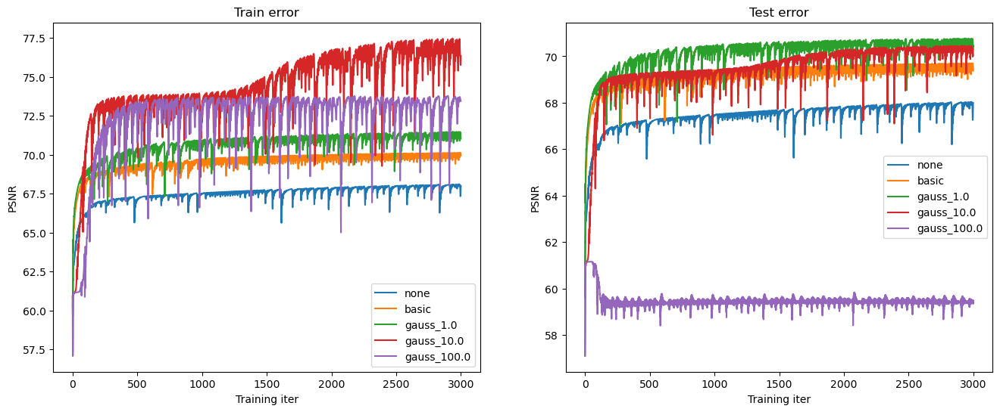

In [129]:
size = 128
X_train, y_train, X_test, y_test=get_input_features(B_dict,"none")
print(y_test.shape)
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_27910/3893910640.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


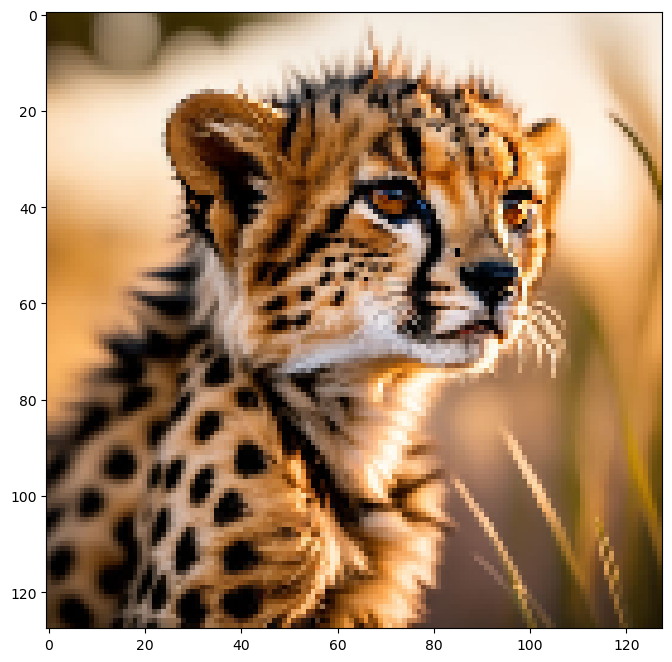

In [68]:
size = 128
train_data, test_data = get_image(size, image_url="https://storage.googleapis.com/pai-images/8de91ae1fc7c4a309ed7052c627d7fc3.jpeg")

#### Experiment on Custom High Resolution Image for Gaussian 10.0

before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

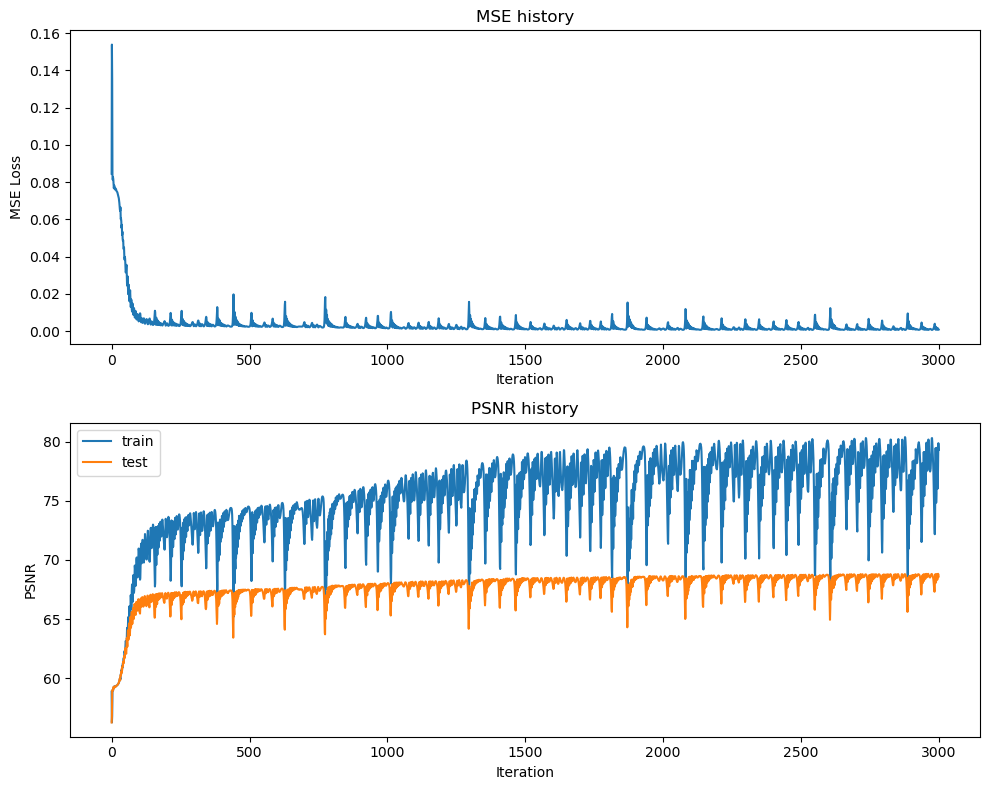

Final Test MSE 0.008972546381188823
Final Test psnr 68.60164648887174


/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_27910/3758130134.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


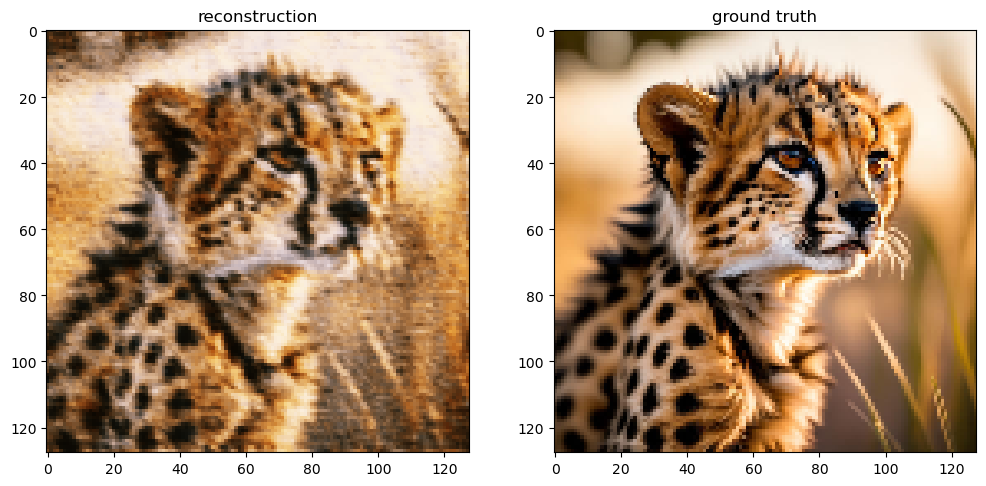

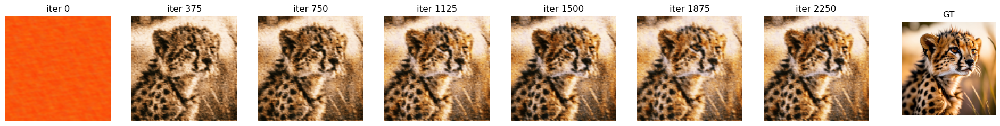

In [69]:
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 3000
learning_rate = .005
output_size = 3
# for k in B_dict.keys():
X_train, y_train, X_test, y_test=get_input_features(B_dict,"gauss_10.0")


net, train_psnr, test_psnr, train_loss, predicted_images=NN_experiment(X_train, y_train, X_test, y_test, 32, num_layers,\
                  hidden_size, hidden_sizes, output_size, epochs,\
                  learning_rate, opt="Adam")
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3893910640.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


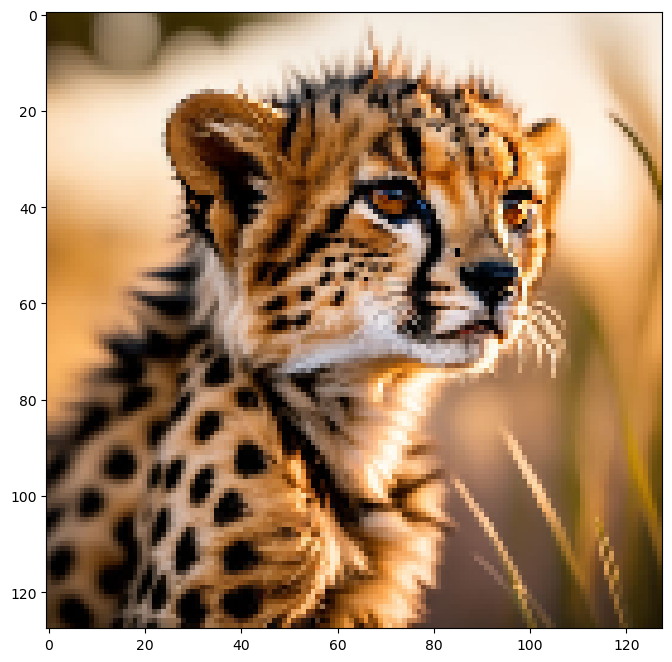

In [130]:
size = 128
train_data, test_data = get_image(size, image_url="https://storage.googleapis.com/pai-images/8de91ae1fc7c4a309ed7052c627d7fc3.jpeg")

#### Training for all types of Feature Mapping

In [131]:
def train_wrapper(mapping, size, opt):
  num_layers = 5
  hidden_size = 256
  hidden_sizes = [hidden_size] * (num_layers - 1)
  epochs = 3000
  learning_rate = .005
  output_size = 3
  input_size = size

  X_train, y_train, X_test, y_test=get_input_features(B_dict,mapping)

  net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(
        X_train, y_train, X_test, y_test, input_size, num_layers, hidden_size, hidden_sizes, output_size, epochs, learning_rate, opt
    )
  return {
      'net': net,
      'train_psnrs': train_psnrs,
      'test_psnrs': test_psnrs,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
  }

In [132]:
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  if k == "none":
        size = 2
  elif k == "basic":
      size = 4
  else:  # Assuming all other keys correspond to Gaussian mappings
      size = 32
  outputs[k] = train_wrapper(k, size, opt="Adam")

  0%|          | 0/5 [00:00<?, ?it/s]

training none
(4096, 2) (4096, 3) (16384, 2) (16384, 3)
<class 'numpy.ndarray'>
[2, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training basic
before: (4096, 2)
after: (4096, 4)
before: (16384, 2)
after: (16384, 4)
(4096, 4) (4096, 3) (16384, 4) (16384, 3)
<class 'numpy.ndarray'>
[4, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_1.0
before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_10.0
before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

training gauss_100.0
before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>
[32, 256, 256, 256, 256, 3]


  0%|          | 0/3000 [00:00<?, ?it/s]

(4096, 2) (4096, 3) (16384, 2) (16384, 3)
<class 'numpy.ndarray'>
(16384, 3)


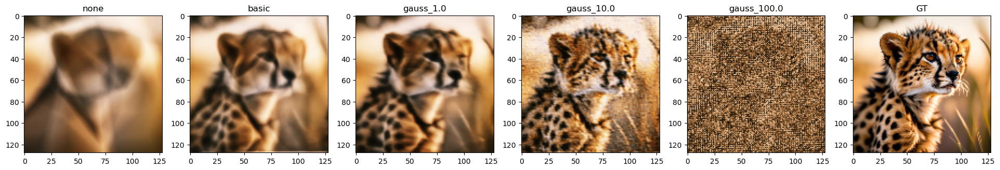

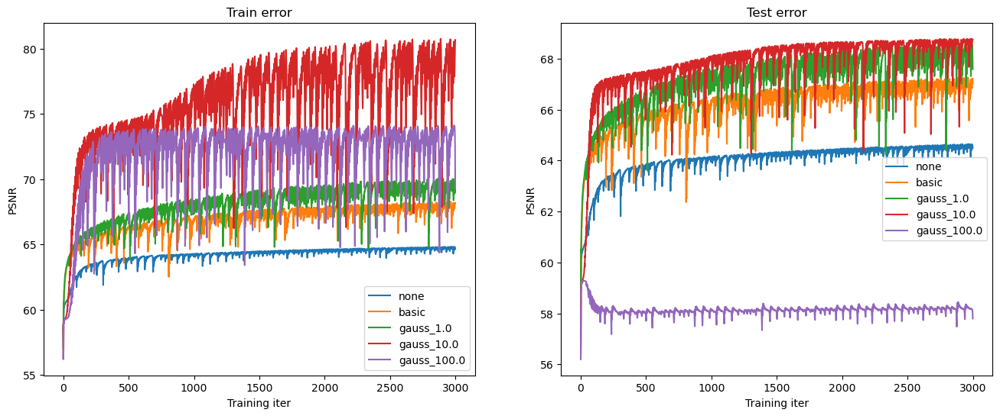

In [133]:

X_train, y_train, X_test, y_test=get_input_features(B_dict,"none")
print(y_test.shape)
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

### Implementation of different m and sigma in gaussion for High Resolution Images

/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3893910640.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


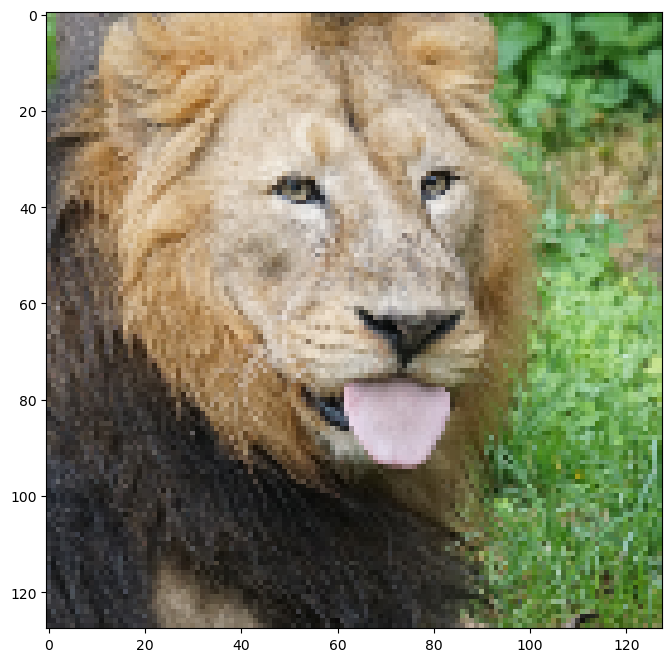

In [163]:
size = 128
train_data, test_data = get_image(size)

In [178]:
def get_B_dict_gauss(size): 
    mapping_size = size // 2 
    B_dict_gauss = {}
    m_values = [0, 1] 
    sigma_values = [0.1, 0.5, 1.0]
    
   
    for m in m_values:
        for sigma in sigma_values:
            for scale in [1., 10., 100.]:
                B_gauss = np.random.normal(loc=m, scale=sigma, size=(mapping_size, 2))
                B_dict_gauss[f'gauss_m{m}_sigma{sigma}_scale{scale}'] = B_gauss * scale

    return B_dict_gauss

before: (4096, 2)
after: (4096, 128)
before: (16384, 2)
after: (16384, 128)
(4096, 128) (4096, 3) (16384, 128) (16384, 3)
<class 'numpy.ndarray'>
[128, 256, 256, 256, 256, 3]


  0%|          | 0/1000 [00:00<?, ?it/s]

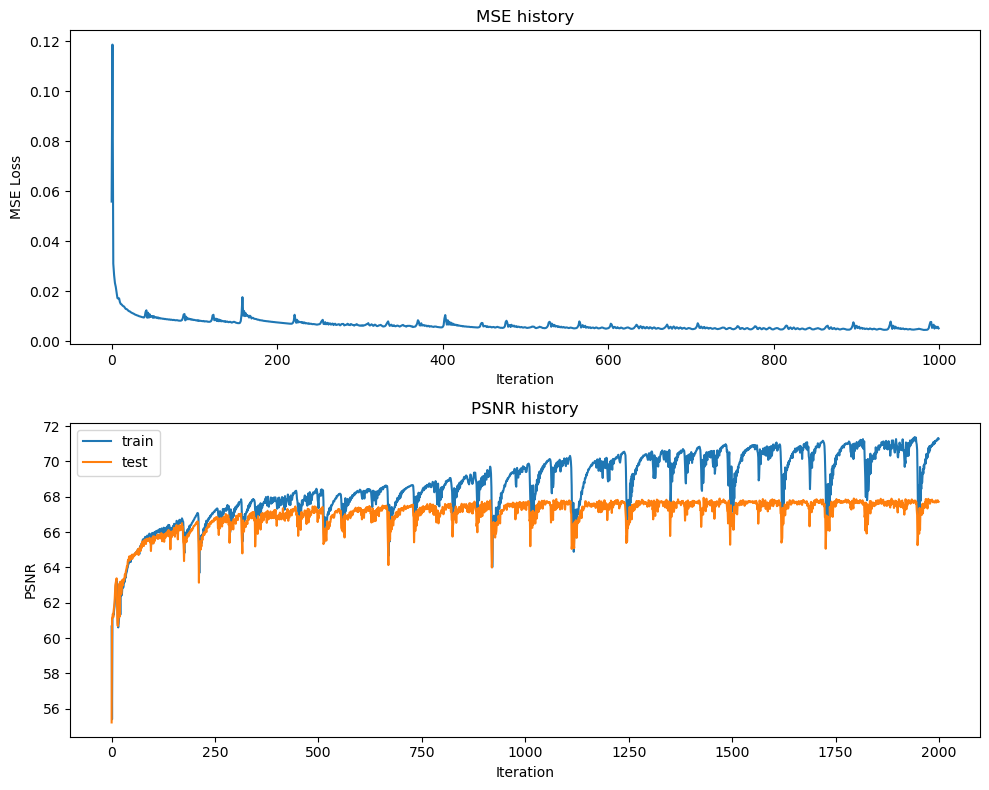

Final Test MSE 0.005946695611732747
Final Test psnr 70.3880465164861


/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3758130134.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, N+1, N+1)


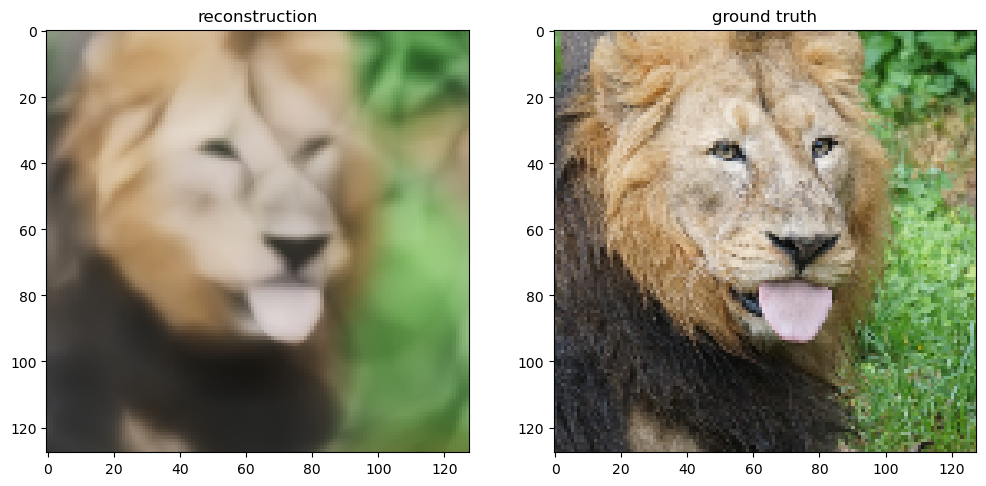

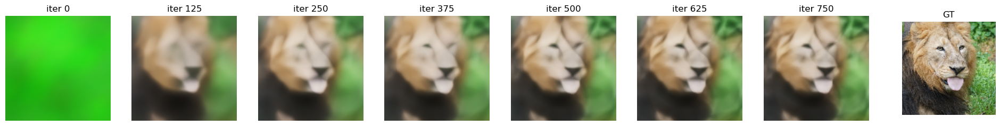

before: (4096, 2)
after: (4096, 128)
before: (16384, 2)
after: (16384, 128)
(4096, 128) (4096, 3) (16384, 128) (16384, 3)
<class 'numpy.ndarray'>
[128, 256, 256, 256, 256, 3]


  0%|          | 0/1000 [00:00<?, ?it/s]

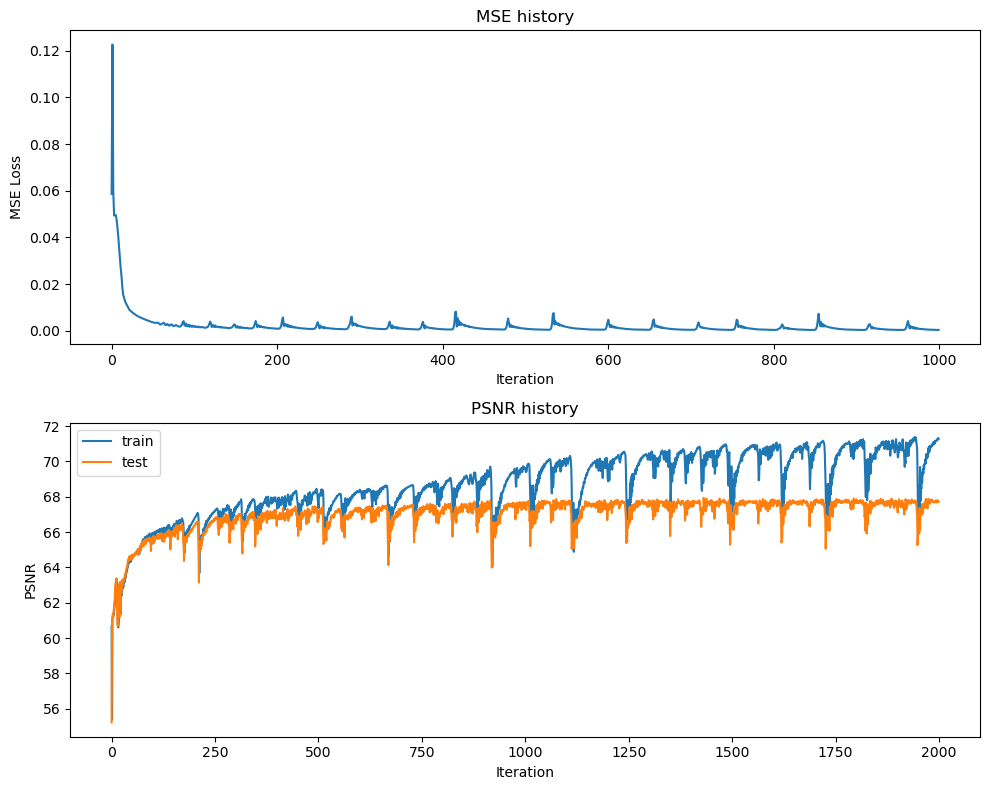

Final Test MSE 0.0038156671302219396
Final Test psnr 72.31509880007056


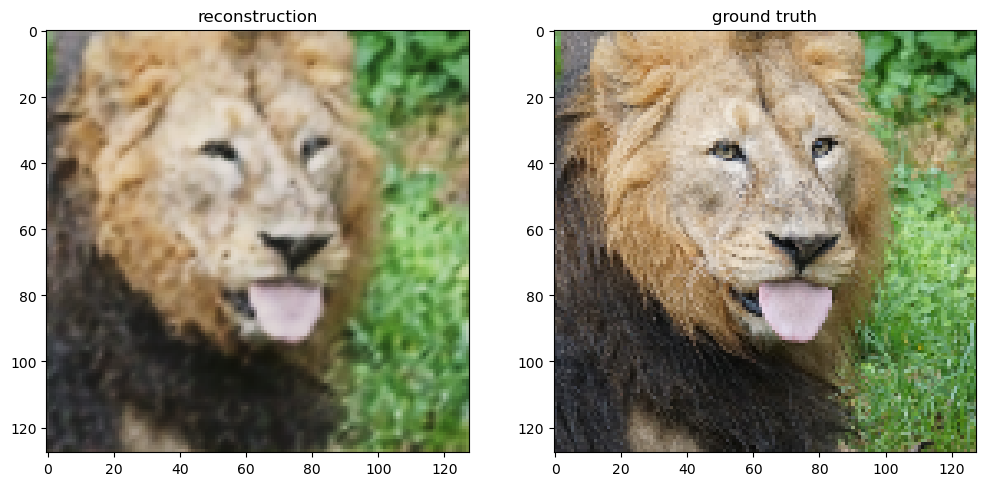

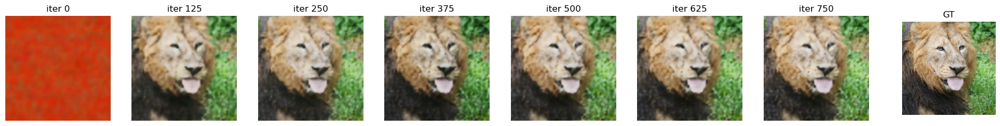

before: (4096, 2)
after: (4096, 128)
before: (16384, 2)
after: (16384, 128)
(4096, 128) (4096, 3) (16384, 128) (16384, 3)
<class 'numpy.ndarray'>
[128, 256, 256, 256, 256, 3]


  0%|          | 0/1000 [00:00<?, ?it/s]

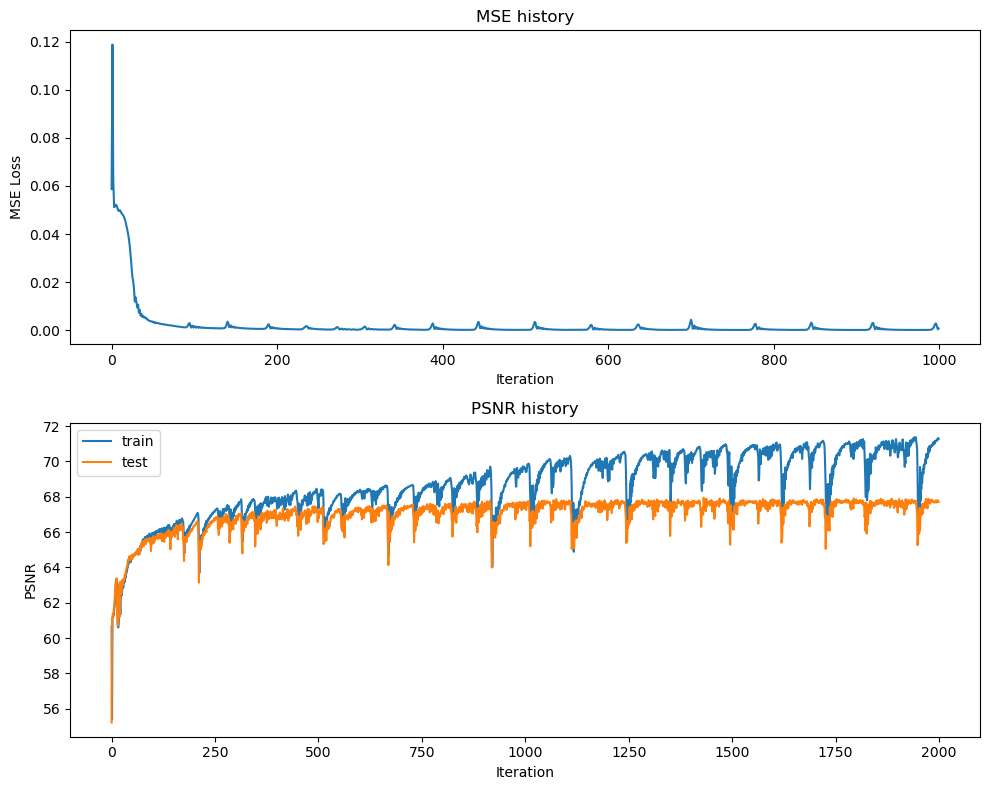

Final Test MSE 0.005067651945750542
Final Test psnr 71.08273581655463


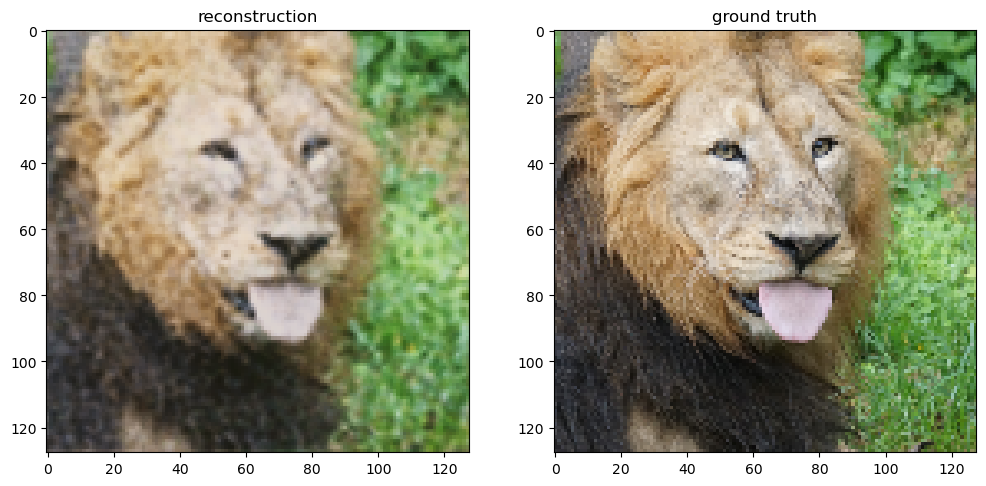

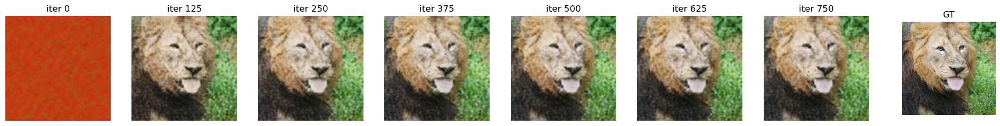

before: (4096, 2)
after: (4096, 128)
before: (16384, 2)
after: (16384, 128)
(4096, 128) (4096, 3) (16384, 128) (16384, 3)
<class 'numpy.ndarray'>
[128, 256, 256, 256, 256, 3]


  0%|          | 0/1000 [00:00<?, ?it/s]

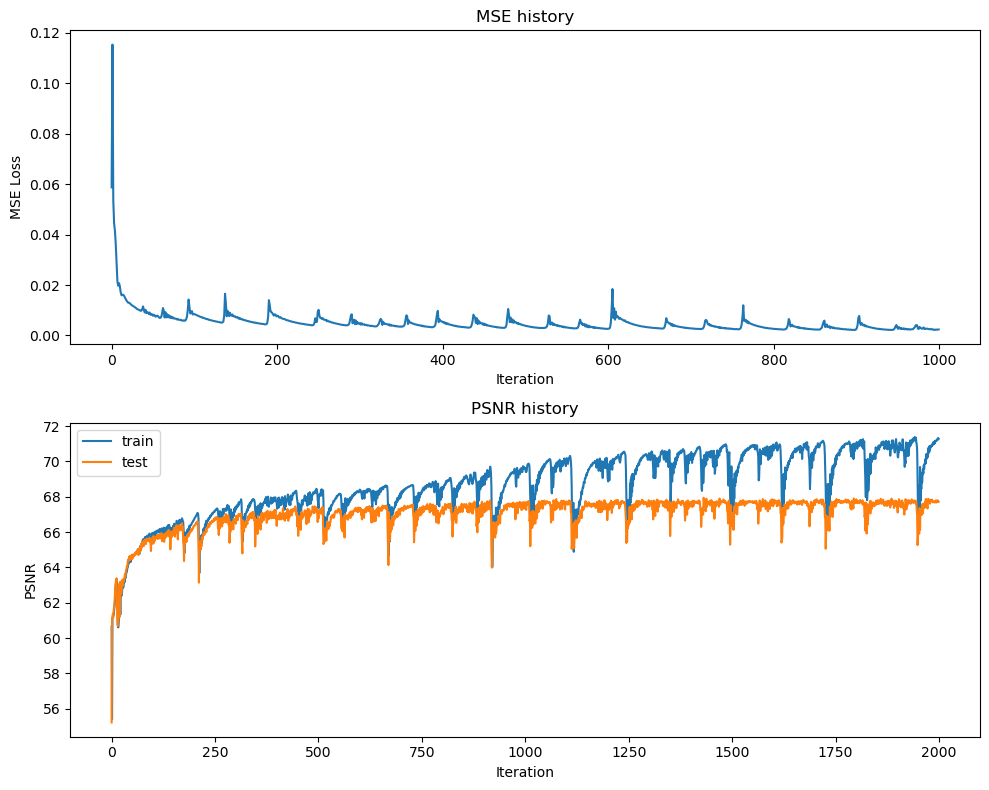

Final Test MSE 0.006899622837671509
Final Test psnr 69.74255009840067


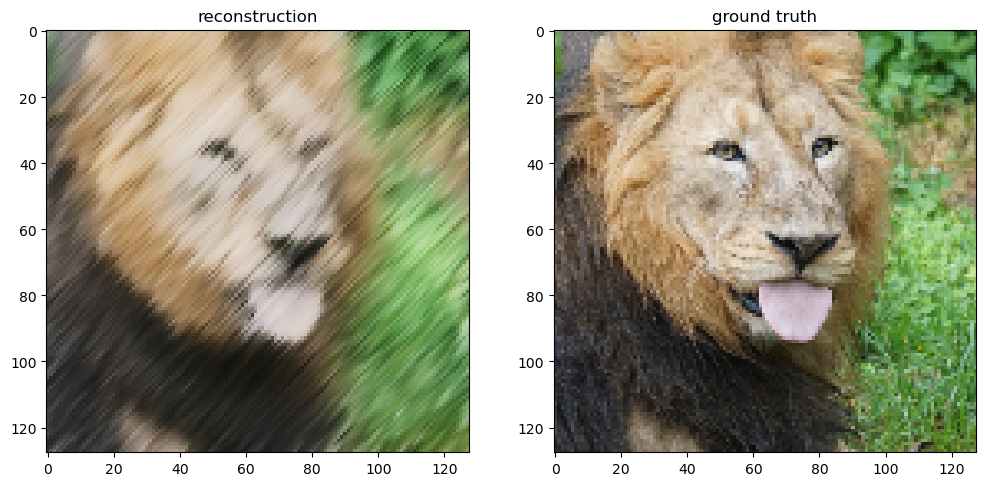

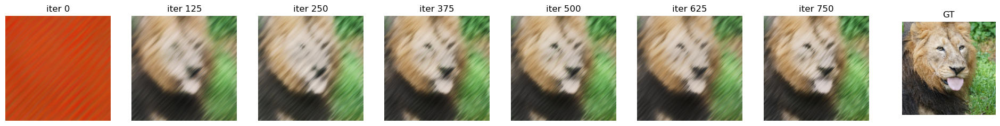

before: (4096, 2)
after: (4096, 128)
before: (16384, 2)
after: (16384, 128)
(4096, 128) (4096, 3) (16384, 128) (16384, 3)
<class 'numpy.ndarray'>
[128, 256, 256, 256, 256, 3]


  0%|          | 0/1000 [00:00<?, ?it/s]

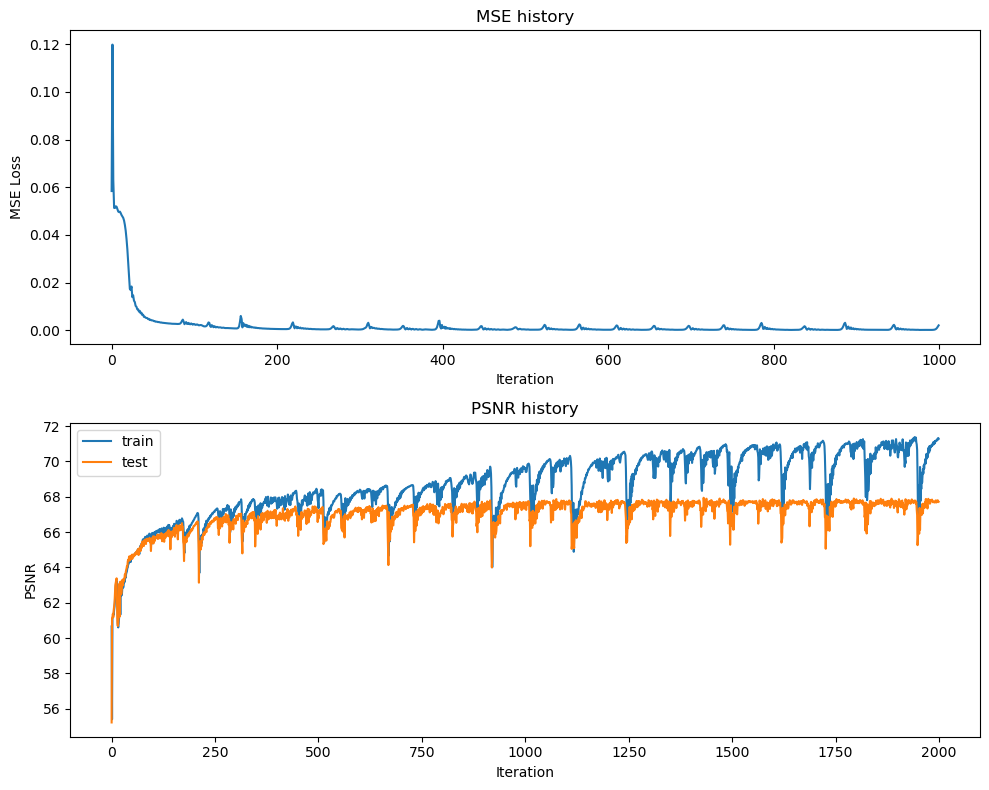

Final Test MSE 0.006341382099995578
Final Test psnr 70.10896438477347


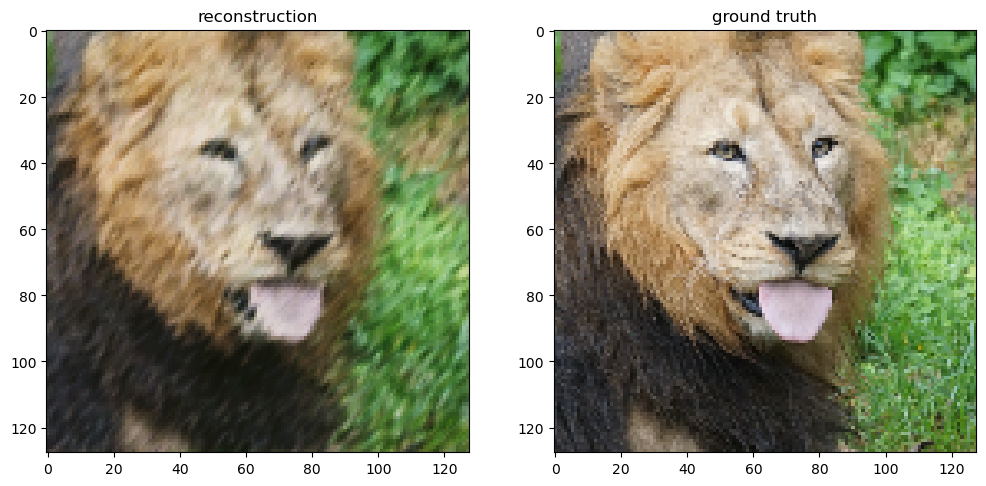

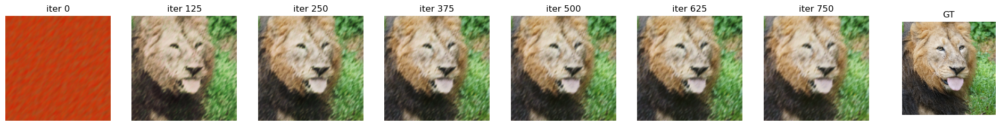

before: (4096, 2)
after: (4096, 128)
before: (16384, 2)
after: (16384, 128)
(4096, 128) (4096, 3) (16384, 128) (16384, 3)
<class 'numpy.ndarray'>
[128, 256, 256, 256, 256, 3]


  0%|          | 0/1000 [00:00<?, ?it/s]

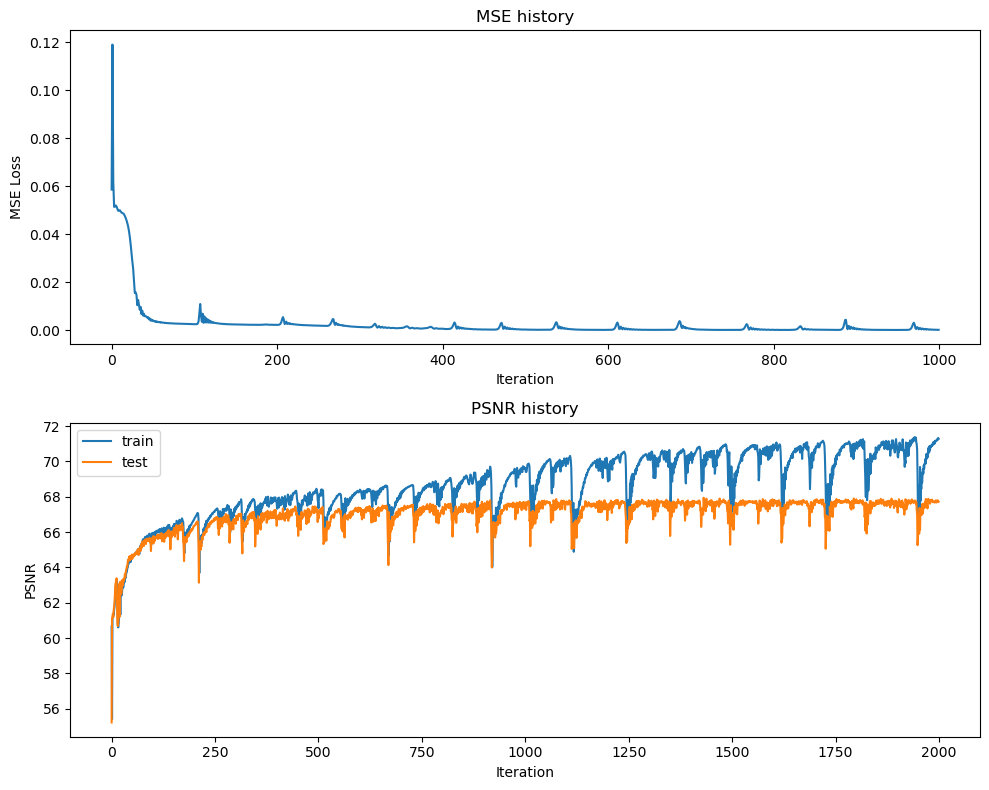

Final Test MSE 0.004620147290655714
Final Test psnr 71.48424539749153


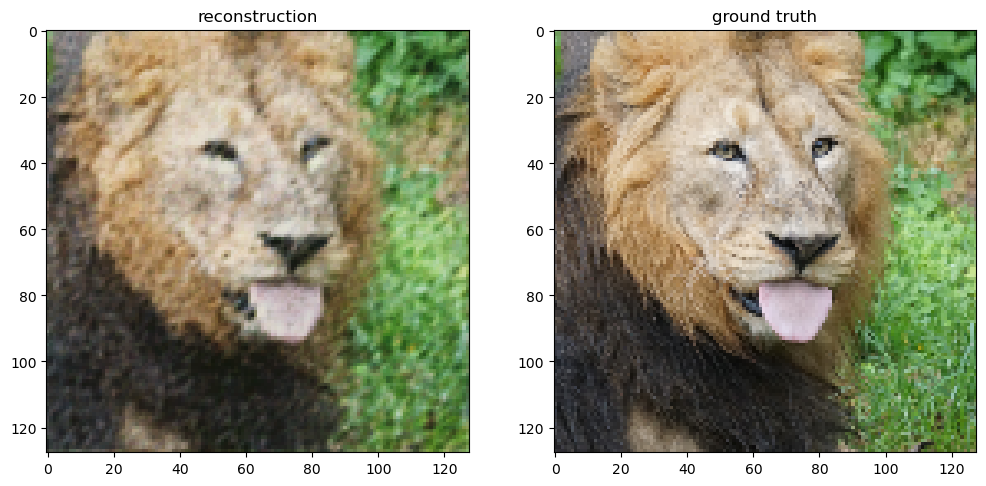

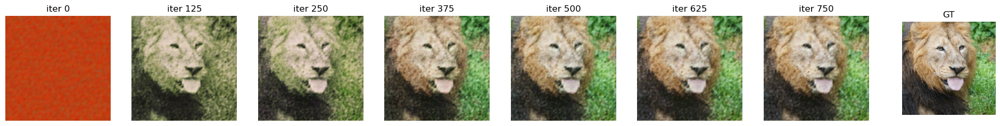

In [179]:
num_layers = 5
hidden_size = 256
hidden_sizes = [hidden_size] * (num_layers - 1)
epochs = 1000
learning_rate = .005
output_size = 3
m_values = [0, 1]  
sigma_values = [0.1, 0.5, 1.0]  
scale_values = [10.] 
size=128
B_dict_gauss = get_B_dict_gauss(size)

for m in m_values:
    for sigma in sigma_values:
        for scale in scale_values:  
            mapping = f'gauss_m{m}_sigma{sigma}_scale{scale}'  
            X_train, y_train, X_test, y_test = get_input_features(B_dict_gauss, mapping)  
            net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(
                X_train, y_train, X_test, y_test, 128, num_layers, hidden_size, hidden_sizes, output_size, epochs, learning_rate, opt="Adam"
            )
            
            plot_training_curves(train_loss, train_psnr, test_psnr)
            plot_reconstruction(net.forward(X_test), y_test)
            plot_reconstruction_progress(predicted_images, y_test)

### Implementation of above Feature Mappings using Adam Optimizer on High Resolution Images using PyTorch AutoGrad

/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3893910640.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


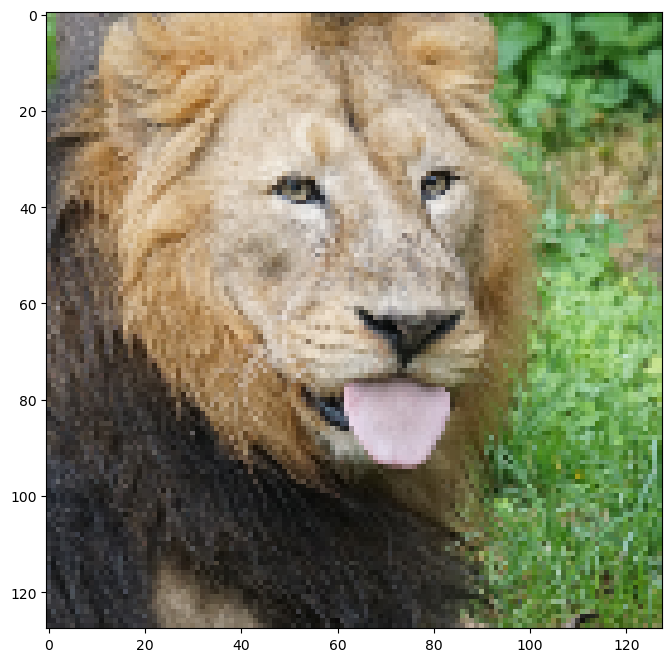

In [134]:
size = 128
train_data, test_data = get_image(size)

In [135]:
import torch
import torch.nn as nn
import torch.optim as optim


class TorchNeuralNet(nn.Module):
    def __init__(self,input_size,hidden_size,output_size):
        super(TorchNeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size).float()  
        self.fc2 = nn.Linear(hidden_size, hidden_size).float()  
        self.fc3 = nn.Linear(hidden_size, hidden_size).float()  
        self.fc4 = nn.Linear(hidden_size, hidden_size).float()  
        self.fc5 = nn.Linear(hidden_size, output_size).float() 

    def forward(self, x):
        x_tensor = torch.tensor(x)  
        x_tensor = x_tensor.float() 
        x_tensor = torch.relu(self.fc1(x_tensor))
        x_tensor = torch.relu(self.fc2(x_tensor))
        x_tensor = torch.relu(self.fc3(x_tensor))
        x_tensor = torch.relu(self.fc4(x_tensor))
        x_tensor = torch.sigmoid(self.fc5(x_tensor))
        
        return x_tensor


In [136]:
def train_wrapper(num_layers,learning_rate, mapping, input_size, opt):

    X_train, y_train, X_test, y_test=get_input_features(B_dict,mapping)

    hidden_size = 256

    model = TorchNeuralNet(input_size,hidden_size,3)


    loss_func = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    num_epochs=3000
    train_loss = np.zeros(num_epochs)
    train_psnr = np.zeros(num_epochs)
    test_psnr = np.zeros(num_epochs)
    predicted_images = np.zeros((num_epochs, y_test.shape[0], y_test.shape[1]))
    

    for epoch in range(num_epochs): 
        np.random.seed(42)
        permutation = np.random.permutation(len(X_train))
        X_train = X_train[permutation]
        y_train = y_train[permutation]

        
        outputs = model(X_train)    
        psnr_i = psnr(outputs.detach().numpy(), y_train)
        train_psnr[epoch] = psnr_i

        loss = loss_func(outputs, torch.tensor(y_train).float())
        train_loss[epoch] = loss.detach().numpy()

        
        optimizer.zero_grad()  
        loss = loss.float()
        loss.backward()        
        optimizer.step()       
       
        
        res_test = model(X_test)
        psnr_test = psnr(res_test.detach().numpy(), y_test)
        test_psnr[epoch] = psnr_test
        predicted_images[epoch] = res_test.detach().numpy()
        
        
        
    return {
      'net': net,
      'train_psnrs': train_psnr,
      'test_psnrs': test_psnr,
      'train_loss': train_loss,
      'pred_imgs': predicted_images
    }

In [ ]:
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  if k == "none":
        size = 2
  elif k == "basic":
      size = 4
  else:  
      size = 32
  outputs[k] = train_wrapper(5,.005, k, size, opt="Adam")

In [138]:
X_train, y_train, X_test, y_test=get_input_features(B_dict,"gauss_1.0")

before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>


(16384, 3)


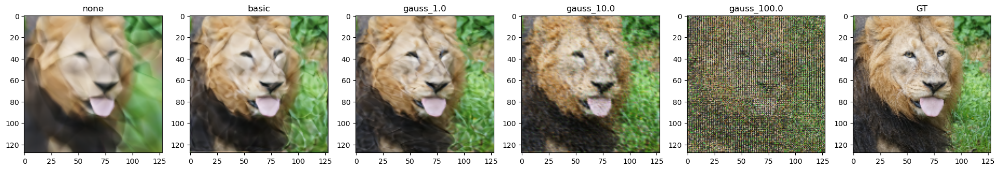

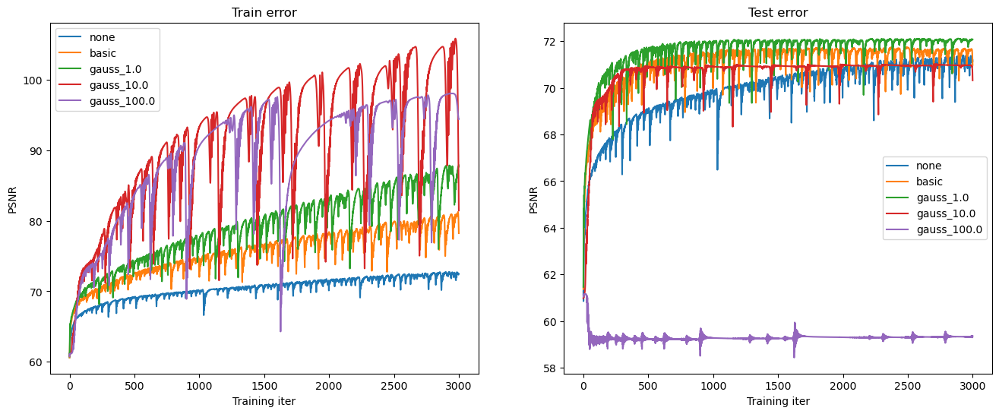

In [139]:
size = 128
print(y_test.shape)
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

/var/folders/jn/67bgfbd955dcdkbs26zgw9780000gn/T/ipykernel_1166/3893910640.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


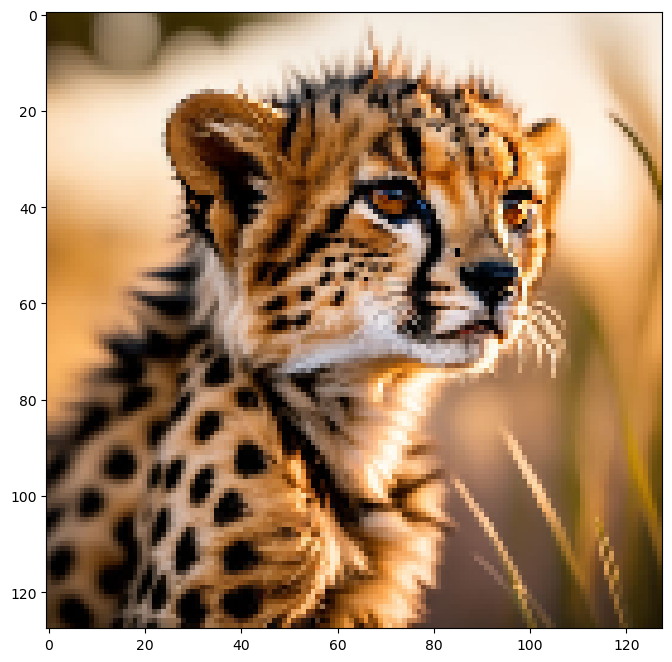

In [140]:
size = 128
train_data, test_data = get_image(size, image_url="https://storage.googleapis.com/pai-images/8de91ae1fc7c4a309ed7052c627d7fc3.jpeg")

In [ ]:
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  if k == "none":
        size = 2
  elif k == "basic":
      size = 4
  else:  
      size = 32
  outputs[k] = train_wrapper(5,.005, k, size, opt="Adam")

In [142]:
X_train, y_train, X_test, y_test=get_input_features(B_dict,"gauss_1.0")

before: (4096, 2)
after: (4096, 32)
before: (16384, 2)
after: (16384, 32)
(4096, 32) (4096, 3) (16384, 32) (16384, 3)
<class 'numpy.ndarray'>


(16384, 3)


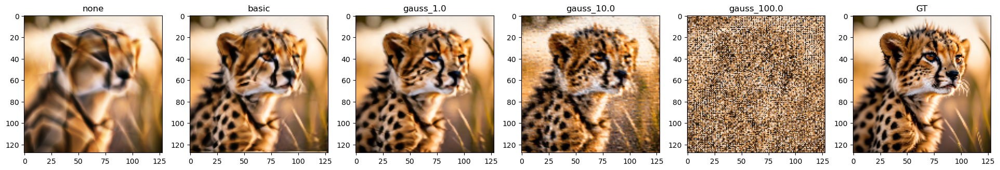

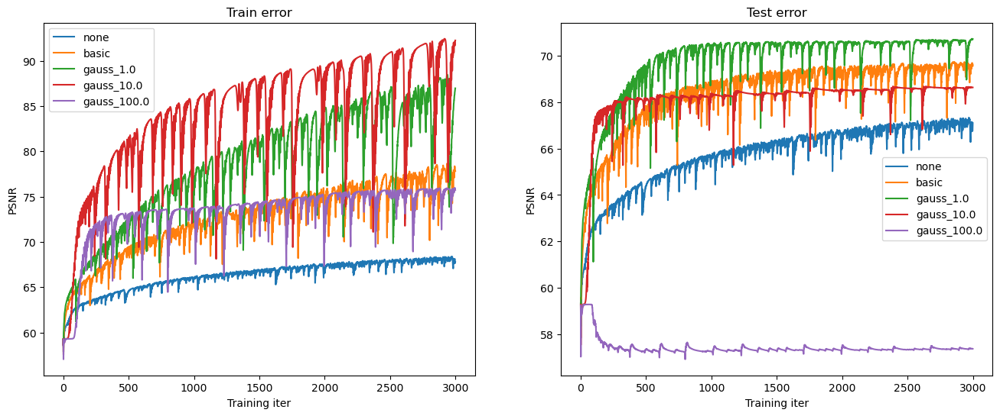

In [143]:
size = 128
print(y_test.shape)
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))